In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import math
from astropy.table import Table
import astropy.units as u

Read in the 3FGL table

In [2]:
t = Table.read('gll_psc_v16.fit')
t

Source_Name,RAJ2000,DEJ2000,GLON,GLAT,Conf_68_SemiMajor,Conf_68_SemiMinor,Conf_68_PosAng,Conf_95_SemiMajor,Conf_95_SemiMinor,Conf_95_PosAng,ROI_num,Signif_Avg,Pivot_Energy,Flux_Density,Unc_Flux_Density,Flux1000,Unc_Flux1000,Energy_Flux100,Unc_Energy_Flux100,Signif_Curve,SpectrumType,Spectral_Index,Unc_Spectral_Index,beta,Unc_beta,Cutoff,Unc_Cutoff,Exp_Index,Unc_Exp_Index,PowerLaw_Index,Flux30_100,Unc_Flux30_100,nuFnu30_100,Sqrt_TS30_100,Flux100_300,Unc_Flux100_300,nuFnu100_300,Sqrt_TS100_300,Flux300_1000,Unc_Flux300_1000,nuFnu300_1000,Sqrt_TS300_1000,Flux1000_3000,Unc_Flux1000_3000,nuFnu1000_3000,Sqrt_TS1000_3000,Flux3000_10000,Unc_Flux3000_10000,nuFnu3000_10000,Sqrt_TS3000_10000,Flux10000_100000,Unc_Flux10000_100000,nuFnu10000_100000,Sqrt_TS10000_100000,Variability_Index,Signif_Peak,Flux_Peak,Unc_Flux_Peak,Time_Peak,Peak_Interval,Flux_History,Unc_Flux_History,Extended_Source_Name,0FGL_Name,1FGL_Name,2FGL_Name,1FHL_Name,ASSOC_GAM1,ASSOC_GAM2,ASSOC_GAM3,TEVCAT_FLAG,ASSOC_TEV,CLASS1,ASSOC1,ASSOC2,Flags
,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,,,MeV,ph / (MeV s cm2),ph / (MeV s cm2),ph / (s cm2),ph / (s cm2),erg / (s cm2),erg / (s cm2),,,,,,,MeV,MeV,,,,ph / (s cm2),ph / (s cm2),erg / (s cm2),,ph / (s cm2),ph / (s cm2),erg / (s cm2),,ph / (s cm2),ph / (s cm2),erg / (s cm2),,ph / (s cm2),ph / (s cm2),erg / (s cm2),,ph / (s cm2),ph / (s cm2),erg / (s cm2),,ph / (s cm2),ph / (s cm2),erg / (s cm2),,,,ph / (s cm2),ph / (s cm2),s,s,ph / (s cm2),ph / (s cm2),,,,,,,,,,,,,,
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes16,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32[2],float32,float32,float32,float32[2],float32,float32,float32,float32[2],float32,float32,float32,float32[2],float32,float32,float32,float32[2],float32,float32,float32,float32,float32,float32,float64,float32,float32[48],"float32[48,2]",bytes18,bytes17,bytes18,bytes18,bytes18,bytes15,bytes14,bytes15,bytes1,bytes21,bytes5,bytes26,bytes26,int16
3FGL J0000.1+6545,0.0377,65.7517,117.6939,3.4030,0.0628,0.0481,41.030,0.1019,0.0780,41.030,185,6.813,1159.08,1.0053e-12,1.4911e-13,1.0160e-09,1.5759212e-10,1.3570e-11,2.0732e-12,3.40,PowerLaw,2.4110,0.0823,-inf,-inf,-inf,-inf,-inf,-inf,2.4110,--,--,--,--,1.8083163e-08,-8.39548e-09 .. 8.236045e-09,4.1752856e-12,2.169,6.9407333e-09,-1.3528098e-09 .. 1.3669199e-09,4.543647e-12,5.270,1.2366493e-09,-2.2512775e-10 .. 2.3434676e-10,2.8553431e-12,6.022,5.78052e-11,-4.04457e-11 .. 4.8533958e-11,3.7841312e-13,1.509,2.8396294e-11,-1.484277e-11 .. 1.91547e-11,4.3172041e-13,2.421,40.753517,-inf,-inf,-inf,-inf,-inf,6.361567e-08 .. 0.0,-2.777704e-08 .. 2.0913118e-08,,,,2FGL J2359.6+6543c,,,,,N,,,,,4
3FGL J0000.2-3738,0.0612,-37.6484,345.4105,-74.9468,0.0451,0.0417,-88.550,0.0731,0.0676,-88.550,589,5.091,3296.33,1.9420e-14,5.1475e-15,2.0387e-10,5.4225336e-11,2.4051e-12,6.7044e-13,1.50,PowerLaw,1.8667,0.1794,-inf,-inf,-inf,-inf,-inf,-inf,1.8667,--,--,--,--,9.876651e-11,-- .. 1.998812e-09,2.4048505e-14,0.000,1.3424871e-10,-- .. 2.668786e-10,9.363738e-14,0.554,1.4509034e-10,-5.8052327e-11 .. 6.8154656e-11,3.5327822e-13,2.941,7.452389e-11,-2.6238078e-11 .. 3.1975783e-11,5.1979796e-13,4.154,1.5907338e-11,-9.25702e-12 .. 1.4521368e-11,2.99165e-13,3.469,44.845318,-inf,-inf,-inf,-inf,-inf,0.0 .. 1.3924737e-09,-- .. 2.1232234e-09,,,,,,,,,N,,,,,0
3FGL J0001.0+6314,0.2535,63.2440,117.2931,0.9257,0.1526,0.0986,-65.320,0.2475,0.1598,-65.320,233,6.164,472.16,8.6247e-12,1.2301e-12,6.4037e-10,1.2908612e-10,1.3029e-11,1.8859e-12,0.26,PowerLaw,2.7328,0.1075,-inf,-inf,-inf,-inf,-inf,-inf,2.7328,--,--,--,--,2.9130298e-08,-7.121452e-09 .. 7.436789e-09,6.5264105e-12,3.974,4.650789e-09,-1.1171207e-09 .. 1.1293722e-09,2.937856e-12,4.250,3.0208774e-10,-1.7640857e-10 .. 1.8435013e-10,6.768034e-13,1.748,1.1586606e-10,-4.2192454e-11 .. 4.7900017e-11,7.3191404e-13,3.275,2.0219642e-12,-- ..

Column names

In [3]:
t.columns

<TableColumns names=('Source_Name','RAJ2000','DEJ2000','GLON','GLAT','Conf_68_SemiMajor','Conf_68_SemiMinor','Conf_68_PosAng','Conf_95_SemiMajor','Conf_95_SemiMinor','Conf_95_PosAng','ROI_num','Signif_Avg','Pivot_Energy','Flux_Density','Unc_Flux_Density','Flux1000','Unc_Flux1000','Energy_Flux100','Unc_Energy_Flux100','Signif_Curve','SpectrumType','Spectral_Index','Unc_Spectral_Index','beta','Unc_beta','Cutoff','Unc_Cutoff','Exp_Index','Unc_Exp_Index','PowerLaw_Index','Flux30_100','Unc_Flux30_100','nuFnu30_100','Sqrt_TS30_100','Flux100_300','Unc_Flux100_300','nuFnu100_300','Sqrt_TS100_300','Flux300_1000','Unc_Flux300_1000','nuFnu300_1000','Sqrt_TS300_1000','Flux1000_3000','Unc_Flux1000_3000','nuFnu1000_3000','Sqrt_TS1000_3000','Flux3000_10000','Unc_Flux3000_10000','nuFnu3000_10000','Sqrt_TS3000_10000','Flux10000_100000','Unc_Flux10000_100000','nuFnu10000_100000','Sqrt_TS10000_100000','Variability_Index','Signif_Peak','Flux_Peak','Unc_Flux_Peak','Time_Peak','Peak_Interval','Flux_History'

Create two tables, one for all usable features in the RF (e.g. 0FGL name is not usable in the RF), and one of manual pre-selection features

In [4]:

good_features  = [
    "Source_Name", "Signif_Avg", "Flux_Density", 
    "Flux1000", "Energy_Flux100", "Signif_Curve", 
    "Spectral_Index", "beta", "PowerLaw_Index", 
    "Variability_Index", "Flux_Peak", "Peak_Interval", 
    "Flux100_300", "Flux300_1000", "Flux1000_3000",
    "Flux3000_10000", "Flux10000_100000", "CLASS1"
]

initial_features_remove = [
    'Source_Name',
    'RAJ2000', 'DEJ2000', 'GLON', 'GLAT',
    'Conf_68_SemiMajor', 'Conf_68_SemiMinor', 'Conf_68_PosAng',
    'Conf_95_SemiMajor', 'Conf_95_SemiMinor', 'Conf_95_PosAng',
    'ROI_num', 'Extended_Source_Name', '0FGL_Name', '1FGL_Name',
    '2FGL_Name', '1FHL_Name', 'ASSOC_GAM1', 'ASSOC_GAM2',
    'ASSOC_GAM3', 'TEVCAT_FLAG', 'ASSOC_TEV', 'ASSOC1',
    'ASSOC2', 'Flags', 'Flux30_100', 'Unc_Flux30_100',
    'nuFnu30_100', 'Sqrt_TS30_100', 'Cutoff', 'SpectrumType',
    'Unc_Flux100_300', 'Unc_Flux300_1000', 'Unc_Flux1000_3000', 
    'Unc_Flux3000_10000', 'Unc_Flux10000_100000', 'Flux_History', 
    'Unc_Flux_History'
]

all_columns = t.colnames  # This returns a list of all column names in the table

# Step 2: Find the remaining columns after removal
usable_features = [col for col in all_columns if col not in initial_features_remove]
print(usable_features)


initial_features_remove_table = t[usable_features]
print(len(initial_features_remove_table.columns))

filtered_table = t[good_features]
filtered_table



['Signif_Avg', 'Pivot_Energy', 'Flux_Density', 'Unc_Flux_Density', 'Flux1000', 'Unc_Flux1000', 'Energy_Flux100', 'Unc_Energy_Flux100', 'Signif_Curve', 'Spectral_Index', 'Unc_Spectral_Index', 'beta', 'Unc_beta', 'Unc_Cutoff', 'Exp_Index', 'Unc_Exp_Index', 'PowerLaw_Index', 'Flux100_300', 'nuFnu100_300', 'Sqrt_TS100_300', 'Flux300_1000', 'nuFnu300_1000', 'Sqrt_TS300_1000', 'Flux1000_3000', 'nuFnu1000_3000', 'Sqrt_TS1000_3000', 'Flux3000_10000', 'nuFnu3000_10000', 'Sqrt_TS3000_10000', 'Flux10000_100000', 'nuFnu10000_100000', 'Sqrt_TS10000_100000', 'Variability_Index', 'Signif_Peak', 'Flux_Peak', 'Unc_Flux_Peak', 'Time_Peak', 'Peak_Interval', 'CLASS1']
39


Source_Name,Signif_Avg,Flux_Density,Flux1000,Energy_Flux100,Signif_Curve,Spectral_Index,beta,PowerLaw_Index,Variability_Index,Flux_Peak,Peak_Interval,Flux100_300,Flux300_1000,Flux1000_3000,Flux3000_10000,Flux10000_100000,CLASS1
,,ph / (MeV s cm2),ph / (s cm2),erg / (s cm2),,,,,,ph / (s cm2),s,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes5
3FGL J0000.1+6545,6.813,1.0053e-12,1.0160e-09,1.3570e-11,3.40,2.4110,-inf,2.4110,40.753517,-inf,-inf,1.8083163e-08,6.9407333e-09,1.2366493e-09,5.78052e-11,2.8396294e-11,
3FGL J0000.2-3738,5.091,1.9420e-14,2.0387e-10,2.4051e-12,1.50,1.8667,-inf,1.8667,44.845318,-inf,-inf,9.876651e-11,1.3424871e-10,1.4509034e-10,7.452389e-11,1.5907338e-11,
3FGL J0001.0+6314,6.164,8.6247e-12,6.4037e-10,1.3029e-11,0.26,2.7328,-inf,2.7328,53.04786,-inf,-inf,2.9130298e-08,4.650789e-09,3.0208774e-10,1.1586606e-10,2.0219642e-12,spp
3FGL J0001.2-0748,11.253,4.8539e-13,6.9522e-10,7.8177e-12,1.90,2.1493,-inf,2.1493,49.738213,-inf,-inf,4.0869415e-09,2.0835744e-09,5.2232985e-10,2.1068917e-10,1.0056333e-11,bll
3FGL J0001.4+2120,11.350,2.5221e-11,2.9449e-10,8.0651e-12,4.41,2.3051,0.5191,2.7775,130.33633,1.1593364e-07,2630000.0,1.5239054e-08,3.639644e-09,3.565206e-10,8.413887e-15,1.0355378e-14,fsrq
3FGL J0001.6+3535,4.200,2.8728e-13,2.6812e-10,3.3858e-12,0.15,2.3505,-inf,2.3505,32.394287,-inf,-inf,9.511114e-09,3.8392234e-10,1.748465e-10,4.0214648e-11,2.2558044e-11,
3FGL J0002.0-6722,5.889,4.8297e-14,2.9212e-10,3.3150e-12,1.37,1.9461,-inf,1.9461,46.125,-inf,-inf,5.3996607e-10,6.487554e-10,2.033252e-10,8.259541e-11,2.7682379e-11,
3FGL J0002.2-4152,5.158,7.3240e-14,2.7140e-10,3.0183e-12,0.20,2.0889,-inf,2.0889,56.351055,-inf,-inf,5.3107603e-09,5.659547e-10,8.5291385e-11,9.7630494e-11,2.5903597e-11,bcu


Filter the tables to only contain blazars, i.e. BL Lacs, FSRQs and BCUs

In [5]:
# only look at bll, fsrq and bcu blazars
blazarTable = filtered_table[[cls in ['bll  ', 'BLL  ', 'fsrq ','FSRQ ', 'bcu  ','BCU  '] for cls in t['CLASS1']]]
blazarTable

Source_Name,Signif_Avg,Flux_Density,Flux1000,Energy_Flux100,Signif_Curve,Spectral_Index,beta,PowerLaw_Index,Variability_Index,Flux_Peak,Peak_Interval,Flux100_300,Flux300_1000,Flux1000_3000,Flux3000_10000,Flux10000_100000,CLASS1
,,ph / (MeV s cm2),ph / (s cm2),erg / (s cm2),,,,,,ph / (s cm2),s,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes5
3FGL J0001.2-0748,11.253,4.8539e-13,6.9522e-10,7.8177e-12,1.90,2.1493,-inf,2.1493,49.738213,-inf,-inf,4.0869415e-09,2.0835744e-09,5.2232985e-10,2.1068917e-10,1.0056333e-11,bll
3FGL J0001.4+2120,11.350,2.5221e-11,2.9449e-10,8.0651e-12,4.41,2.3051,0.5191,2.7775,130.33633,1.1593364e-07,2630000.0,1.5239054e-08,3.639644e-09,3.565206e-10,8.413887e-15,1.0355378e-14,fsrq
3FGL J0002.2-4152,5.158,7.3240e-14,2.7140e-10,3.0183e-12,0.20,2.0889,-inf,2.0889,56.351055,-inf,-inf,5.3107603e-09,5.659547e-10,8.5291385e-11,9.7630494e-11,2.5903597e-11,bcu
3FGL J0003.2-5246,5.670,1.9988e-14,2.5904e-10,3.0072e-12,0.91,1.8952,-inf,1.8952,45.280437,-inf,-inf,6.580338e-09,8.266808e-13,1.8392893e-10,7.936658e-11,2.977405e-11,bcu
3FGL J0003.8-1151,4.181,4.4152e-14,2.3390e-10,2.6042e-12,1.79,2.0235,-inf,2.0235,48.491646,-inf,-inf,5.977301e-11,5.2658294e-10,2.3129536e-10,4.661099e-11,1.7722861e-11,bcu
3FGL J0004.7-4740,14.520,2.1259e-12,6.9288e-10,9.1864e-12,1.84,2.4035,-inf,2.4035,112.932655,6.7482695e-08,2630000.0,1.10752705e-08,3.3819725e-09,6.0069094e-10,1.3373962e-10,4.871773e-16,fsrq
3FGL J0006.4+3825,10.546,6.1207e-12,6.0569e-10,1.0384e-11,2.28,2.6171,-inf,2.6171,80.4625,7.8629775e-08,2630000.0,2.2237138e-08,3.5082102e-09,5.841618e-10,3.5785295e-11,7.857734e-12,fsrq
3FGL J0008.0+4713,24.745,5.6820e-13,1.9664e-09,2.1900e-11,2.51,2.0210,-inf,2.0210,36.713474,-inf,-inf,5.73839e-09,4.4303685e-09,1.4026769e-09,5.7460514e-10,1.2905586e-10,bll


In [6]:
blazar_initial_features_remove_table = initial_features_remove_table[[cls in ['bll  ', 'BLL  ', 'fsrq ','FSRQ ', 'bcu  ','BCU  '] for cls in t['CLASS1']]]
blazar_initial_features_remove_table

Signif_Avg,Pivot_Energy,Flux_Density,Unc_Flux_Density,Flux1000,Unc_Flux1000,Energy_Flux100,Unc_Energy_Flux100,Signif_Curve,Spectral_Index,Unc_Spectral_Index,beta,Unc_beta,Unc_Cutoff,Exp_Index,Unc_Exp_Index,PowerLaw_Index,Flux100_300,nuFnu100_300,Sqrt_TS100_300,Flux300_1000,nuFnu300_1000,Sqrt_TS300_1000,Flux1000_3000,nuFnu1000_3000,Sqrt_TS1000_3000,Flux3000_10000,nuFnu3000_10000,Sqrt_TS3000_10000,Flux10000_100000,nuFnu10000_100000,Sqrt_TS10000_100000,Variability_Index,Signif_Peak,Flux_Peak,Unc_Flux_Peak,Time_Peak,Peak_Interval,CLASS1
,MeV,ph / (MeV s cm2),ph / (MeV s cm2),ph / (s cm2),ph / (s cm2),erg / (s cm2),erg / (s cm2),,,,,,MeV,,,,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,,,ph / (s cm2),ph / (s cm2),s,s,
float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float32,bytes5
11.253,1263.84,4.8539e-13,5.7004e-14,6.9522e-10,8.960151e-11,7.8177e-12,9.4557e-13,1.90,2.1493,0.0868,-inf,-inf,-inf,-inf,-inf,2.1493,4.0869415e-09,9.677897e-13,1.630,2.0835744e-09,1.4056578e-12,5.266,5.2232985e-10,1.2368795e-12,6.997,2.1068917e-10,1.4213885e-12,8.018,1.0056333e-11,1.6862815e-13,1.574,49.738213,-inf,-inf,-inf,-inf,-inf,bll
11.350,310.68,2.5221e-11,2.7971e-12,2.9449e-10,7.575459e-11,8.0651e-12,8.3790e-13,4.41,2.3051,0.1801,0.5191,0.1551,-inf,-inf,-inf,2.7775,1.5239054e-08,3.773258e-12,6.788,3.639644e-09,2.2599542e-12,7.591,3.565206e-10,7.1526216e-13,4.517,8.413887e-15,4.392482e-17,0.000,1.0355378e-14,9.594525e-17,0.000,130.33633,8.248339,1.1593364e-07,1.8574745e-08,301135008.0,2630000.0,fsrq
5.158,1956.04,7.3240e-14,1.6189e-14,2.7140e-10,6.100457e-11,3.0183e-12,6.7122e-13,0.20,2.0889,0.1896,-inf,-inf,-inf,-inf,-inf,2.0889,5.3107603e-09,1.2650496e-12,2.475,5.659547e-10,3.845211e-13,2.060,8.5291385e-11,2.0316832e-13,1.513,9.7630494e-11,6.633214e-13,4.735,2.5903597e-11,4.448439e-13,2.584,56.351055,-inf,-inf,-inf,-inf,-inf,bcu
5.670,3676.23,1.9988e-14,4.9584e-15,2.5904e-10,6.531588e-11,3.0072e-12,7.5853e-13,0.91,1.8952,0.1740,-inf,-inf,-inf,-inf,-inf,1.8952,6.580338e-09,1.5977147e-12,1.750,8.266808e-13,5.746546e-16,0.000,1.8392893e-10,4.4658187e-13,3.079,7.936658e-11,5.517048e-13,3.738,2.977405e-11,5.533345e-13,4.510,45.280437,-inf,-inf,-inf,-inf,-inf,bcu
4.181,2315.88,4.4152e-14,1.1922e-14,2.3390e-10,6.327032e-11,2.6042e-12,7.1025e-13,1.79,2.0235,0.1756,-inf,-inf,-inf,-inf,-inf,2.0235,5.977301e-11,1.4330047e-14,0.000,5.2658294e-10,3.6053113e-13,1.537,2.3129536e-10,5.5451e-13,3.793,4.661099e-11,3.1912756e-13,2.465,1.7722861e-11,3.12454e-13,2.541,48.491646,-inf,-inf,-inf,-inf,-inf,bcu
14.520,722.60,2.1259e-12,1.8656e-13,6.9288e-10,8.130467e-11,9.1864e-12,8.0677e-13,1.84,2.4035,0.0757,-inf,-inf,-inf,-inf,-inf,2.4035,1.10752705e-08,2.5590237e-12,3.953,3.3819725e-09,2.2158265e-12,9.398,6.0069094e-10,1.3879412e-12,9.057,1.3373962e-10,8.7624537e-13,6.187,4.871773e-16,7.426467e-18,0.000,112.932655,7.8222976,6.7482695e-08,1.1923433e-08,295875008.0,2630000.0,fsrq
10.546,496.53,6.1207e-12,6.0769e-13,6.0569e-10,8.90177e-11,1.0384e-11,1.0331e-12,2.28,2.6171,0.0824,-inf,-inf,-inf,-inf,-inf,2.6171,2.2237138e-08,5.035585e-12,5.619,3.5082102e-09,2.244264e-12,6.910,5.841618e-10,1.3228304e-12,6.122,3.5785295e-11,2.2892484e-13,1.556,7.857734e-12,1.1134101e-13,0.880,80.4625,4.02478,7.8629775e-08,2.1034724e-08,277464992.0,2630000.0,fsrq
24.745,1875.71,5.6820e-13,3.6372e-14,1.9664e-09,1.294796e-10,2.1900e-11,1.4827e-12,2.51,2.0210,0.0502,-inf,-inf,-inf,-inf,-inf,2.0210,5.73839e-09,1.37607e-12,1.320,4.4303685e-09,3.034206e-12,8.752,1.4026769e-09,3.3636293e-12,14.329,5.7460514e-10,3.9352714e-12,16.663,1.2905586e-10,2.2775826e-12,8.899,36.713474,-inf,-inf,-inf,-inf,-inf,bll


Calculate the hardness ratios and harndess scales for bins:<br> 
Flux100_300, Flux300_1000, Flux1000_3000, Flux3000_10000, Flux10000_100000<br>
Formula:<br>
$$ \text{HR} = \frac{\text{$EF_j$ - $EF_i$}}{\text{$EF_j$ + $EF_i$}} $$ <br>
HS = $HR_i$-$HR_j$, i < j <br>
Method from: https://arxiv.org/pdf/1306.6529

In [7]:
# HR100_300_1000
E1i = math.log(100) + (math.log(300)-math.log(100))/2
E1j = math.log(300) + (math.log(1000)-math.log(300))/2

# HR300_1000_3000
E2i = E1j
E2j = math.log(1000) + (math.log(3000)-math.log(1000))/2

# HR1000_3000_10000
E3i = E2j
E3j = math.log(3000) + (math.log(10000)-math.log(3000))/2

# HR3000_10000_100000
E4i = E3j
E4j = math.log(10000) + (math.log(100000)-math.log(10000))/2


blazarTable['HR1'] = (E1i*np.log(blazarTable['Flux100_300']) - E1j*np.log(blazarTable['Flux300_1000']))/(E1i*np.log(blazarTable['Flux100_300']) + E1j*np.log(blazarTable['Flux300_1000']))
blazarTable['HR2'] = (E2i*np.log(blazarTable['Flux300_1000']) - E2j*np.log(blazarTable['Flux1000_3000']))/(E2i*np.log(blazarTable['Flux300_1000']) + E2j*np.log(blazarTable['Flux1000_3000']))
blazarTable['HR3'] = (E3i*np.log(blazarTable['Flux1000_3000']) - E3j*np.log(blazarTable['Flux3000_10000']))/(E3i*np.log(blazarTable['Flux1000_3000']) + E3j*np.log(blazarTable['Flux3000_10000']))
blazarTable['HR4'] = (E4i*np.log(blazarTable['Flux3000_10000']) - E4j*np.log(blazarTable['Flux10000_100000']))/(E4i*np.log(blazarTable['Flux3000_10000']) + E4j*np.log(blazarTable['Flux10000_100000']))


blazarTable['HS1'] = blazarTable['HR1'] - blazarTable['HR2']
blazarTable['HS2'] = blazarTable['HR2'] - blazarTable['HR3']
blazarTable['HS3'] = blazarTable['HR3'] - blazarTable['HR4']

blazarTable

Source_Name,Signif_Avg,Flux_Density,Flux1000,Energy_Flux100,Signif_Curve,Spectral_Index,beta,PowerLaw_Index,Variability_Index,Flux_Peak,Peak_Interval,Flux100_300,Flux300_1000,Flux1000_3000,Flux3000_10000,Flux10000_100000,CLASS1,HR1,HR2,HR3,HR4,HS1,HS2,HS3
,,ph / (MeV s cm2),ph / (s cm2),erg / (s cm2),,,,,,ph / (s cm2),s,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2)
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes5,float32,float32,float32,float32,float32,float32,float32
3FGL J0001.2-0748,11.253,4.8539e-13,6.9522e-10,7.8177e-12,1.90,2.1493,-inf,2.1493,49.738213,-inf,-inf,4.0869415e-09,2.0835744e-09,5.2232985e-10,2.1068917e-10,1.0056333e-11,bll,-0.117398314,-0.11677519,-0.09232347,-0.15541269,-0.00062312186,-0.024451725,0.06308922
3FGL J0001.4+2120,11.350,2.5221e-11,2.9449e-10,8.0651e-12,4.41,2.3051,0.5191,2.7775,130.33633,1.1593364e-07,2630000.0,1.5239054e-08,3.639644e-09,3.565206e-10,8.413887e-15,1.0355378e-14,fsrq,-0.1381852,-0.13940322,-0.26463786,-0.08923693,0.0012180209,0.12523463,-0.17540093
3FGL J0002.2-4152,5.158,7.3240e-14,2.7140e-10,3.0183e-12,0.20,2.0889,-inf,2.0889,56.351055,-inf,-inf,5.3107603e-09,5.659547e-10,8.5291385e-11,9.7630494e-11,2.5903597e-11,bcu,-0.15508938,-0.12575303,-0.06875479,-0.12008946,-0.029336348,-0.056998238,0.051334664
3FGL J0003.2-5246,5.670,1.9988e-14,2.5904e-10,3.0072e-12,0.91,1.8952,-inf,1.8952,45.280437,-inf,-inf,6.580338e-09,8.266808e-13,1.8392893e-10,7.936658e-11,2.977405e-11,bcu,-0.2874023,0.024151074,-0.08994601,-0.11285187,-0.3115534,0.11409708,0.022905864
3FGL J0003.8-1151,4.181,4.4152e-14,2.3390e-10,2.6042e-12,1.79,2.0235,-inf,2.0235,48.491646,-inf,-inf,5.977301e-11,5.2658294e-10,2.3129536e-10,4.661099e-11,1.7722861e-11,bcu,-0.052259542,-0.10238095,-0.10623829,-0.11213658,0.050121404,0.0038573444,0.0058982894
3FGL J0004.7-4740,14.520,2.1259e-12,6.9288e-10,9.1864e-12,1.84,2.4035,-inf,2.4035,112.932655,6.7482695e-08,2630000.0,1.10752705e-08,3.3819725e-09,6.0069094e-10,1.3373962e-10,4.871773e-16,fsrq,-0.13140869,-0.12562744,-0.10556967,-0.30232605,-0.005781248,-0.020057775,0.1967564
3FGL J0006.4+3825,10.546,6.1207e-12,6.0569e-10,1.0384e-11,2.28,2.6171,-inf,2.6171,80.4625,7.8629775e-08,2630000.0,2.2237138e-08,3.5082102e-09,5.841618e-10,3.5785295e-11,7.857734e-12,fsrq,-0.14950098,-0.12719883,-0.13270491,-0.122628726,-0.02230215,0.0055060834,-0.010076188
3FGL J0008.0+4713,24.745,5.6820e-13,1.9664e-09,2.1900e-11,2.51,2.0210,-inf,2.0210,36.713474,-inf,-inf,5.73839e-09,4.4303685e-09,1.4026769e-09,5.7460514e-10,1.2905586e-10,bll,-0.10715704,-0.11240784,-0.09294133,-0.12593389,0.005250804,-0.019466512,0.032992557


Create a new feature, $$ \text{Normalised\_Flux\_Peak} = \frac{\text{Flux\_Peak}}{\text{Energy\_Flux100}} $$

In [8]:
# normalising Flux peak
blazarTable['Normalised_Flux_Peak'] = blazarTable['Flux_Peak']/blazarTable['Energy_Flux100']
blazarTable
    

Source_Name,Signif_Avg,Flux_Density,Flux1000,Energy_Flux100,Signif_Curve,Spectral_Index,beta,PowerLaw_Index,Variability_Index,Flux_Peak,Peak_Interval,Flux100_300,Flux300_1000,Flux1000_3000,Flux3000_10000,Flux10000_100000,CLASS1,HR1,HR2,HR3,HR4,HS1,HS2,HS3,Normalised_Flux_Peak
,,ph / (MeV s cm2),ph / (s cm2),erg / (s cm2),,,,,,ph / (s cm2),s,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2)
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes5,float32,float32,float32,float32,float32,float32,float32,float32
3FGL J0001.2-0748,11.253,4.8539e-13,6.9522e-10,7.8177e-12,1.90,2.1493,-inf,2.1493,49.738213,-inf,-inf,4.0869415e-09,2.0835744e-09,5.2232985e-10,2.1068917e-10,1.0056333e-11,bll,-0.117398314,-0.11677519,-0.09232347,-0.15541269,-0.00062312186,-0.024451725,0.06308922,-inf
3FGL J0001.4+2120,11.350,2.5221e-11,2.9449e-10,8.0651e-12,4.41,2.3051,0.5191,2.7775,130.33633,1.1593364e-07,2630000.0,1.5239054e-08,3.639644e-09,3.565206e-10,8.413887e-15,1.0355378e-14,fsrq,-0.1381852,-0.13940322,-0.26463786,-0.08923693,0.0012180209,0.12523463,-0.17540093,14374.76
3FGL J0002.2-4152,5.158,7.3240e-14,2.7140e-10,3.0183e-12,0.20,2.0889,-inf,2.0889,56.351055,-inf,-inf,5.3107603e-09,5.659547e-10,8.5291385e-11,9.7630494e-11,2.5903597e-11,bcu,-0.15508938,-0.12575303,-0.06875479,-0.12008946,-0.029336348,-0.056998238,0.051334664,-inf
3FGL J0003.2-5246,5.670,1.9988e-14,2.5904e-10,3.0072e-12,0.91,1.8952,-inf,1.8952,45.280437,-inf,-inf,6.580338e-09,8.266808e-13,1.8392893e-10,7.936658e-11,2.977405e-11,bcu,-0.2874023,0.024151074,-0.08994601,-0.11285187,-0.3115534,0.11409708,0.022905864,-inf
3FGL J0003.8-1151,4.181,4.4152e-14,2.3390e-10,2.6042e-12,1.79,2.0235,-inf,2.0235,48.491646,-inf,-inf,5.977301e-11,5.2658294e-10,2.3129536e-10,4.661099e-11,1.7722861e-11,bcu,-0.052259542,-0.10238095,-0.10623829,-0.11213658,0.050121404,0.0038573444,0.0058982894,-inf
3FGL J0004.7-4740,14.520,2.1259e-12,6.9288e-10,9.1864e-12,1.84,2.4035,-inf,2.4035,112.932655,6.7482695e-08,2630000.0,1.10752705e-08,3.3819725e-09,6.0069094e-10,1.3373962e-10,4.871773e-16,fsrq,-0.13140869,-0.12562744,-0.10556967,-0.30232605,-0.005781248,-0.020057775,0.1967564,7345.973
3FGL J0006.4+3825,10.546,6.1207e-12,6.0569e-10,1.0384e-11,2.28,2.6171,-inf,2.6171,80.4625,7.8629775e-08,2630000.0,2.2237138e-08,3.5082102e-09,5.841618e-10,3.5785295e-11,7.857734e-12,fsrq,-0.14950098,-0.12719883,-0.13270491,-0.122628726,-0.02230215,0.0055060834,-0.010076188,7572.1855
3FGL J0008.0+4713,24.745,5.6820e-13,1.9664e-09,2.1900e-11,2.51,2.0210,-inf,2.0210,36.713474,-inf,-inf,5.73839e-09,4.4303685e-09,1.4026769e-09,5.7460514e-10,1.2905586e-10,bll,-0.10715704,-0.11240784,-0.09294133,-0.12593389,0.005250804,-0.019466512,0.032992557,-inf


Create a new feature, loggedFlux_Density = log(Flux_Density)

In [9]:
# logging the flux density
blazarTable['loggedFlux_Density'] = np.log(blazarTable['Flux_Density'])
blazarTable

Source_Name,Signif_Avg,Flux_Density,Flux1000,Energy_Flux100,Signif_Curve,Spectral_Index,beta,PowerLaw_Index,Variability_Index,Flux_Peak,Peak_Interval,Flux100_300,Flux300_1000,Flux1000_3000,Flux3000_10000,Flux10000_100000,CLASS1,HR1,HR2,HR3,HR4,HS1,HS2,HS3,Normalised_Flux_Peak,loggedFlux_Density
,,ph / (MeV s cm2),ph / (s cm2),erg / (s cm2),,,,,,ph / (s cm2),s,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (MeV s cm2)
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes5,float32,float32,float32,float32,float32,float32,float32,float32,float32
3FGL J0001.2-0748,11.253,4.8539e-13,6.9522e-10,7.8177e-12,1.90,2.1493,-inf,2.1493,49.738213,-inf,-inf,4.0869415e-09,2.0835744e-09,5.2232985e-10,2.1068917e-10,1.0056333e-11,bll,-0.117398314,-0.11677519,-0.09232347,-0.15541269,-0.00062312186,-0.024451725,0.06308922,-inf,-2.8354e+01
3FGL J0001.4+2120,11.350,2.5221e-11,2.9449e-10,8.0651e-12,4.41,2.3051,0.5191,2.7775,130.33633,1.1593364e-07,2630000.0,1.5239054e-08,3.639644e-09,3.565206e-10,8.413887e-15,1.0355378e-14,fsrq,-0.1381852,-0.13940322,-0.26463786,-0.08923693,0.0012180209,0.12523463,-0.17540093,14374.76,-2.4403e+01
3FGL J0002.2-4152,5.158,7.3240e-14,2.7140e-10,3.0183e-12,0.20,2.0889,-inf,2.0889,56.351055,-inf,-inf,5.3107603e-09,5.659547e-10,8.5291385e-11,9.7630494e-11,2.5903597e-11,bcu,-0.15508938,-0.12575303,-0.06875479,-0.12008946,-0.029336348,-0.056998238,0.051334664,-inf,-3.0245e+01
3FGL J0003.2-5246,5.670,1.9988e-14,2.5904e-10,3.0072e-12,0.91,1.8952,-inf,1.8952,45.280437,-inf,-inf,6.580338e-09,8.266808e-13,1.8392893e-10,7.936658e-11,2.977405e-11,bcu,-0.2874023,0.024151074,-0.08994601,-0.11285187,-0.3115534,0.11409708,0.022905864,-inf,-3.1544e+01
3FGL J0003.8-1151,4.181,4.4152e-14,2.3390e-10,2.6042e-12,1.79,2.0235,-inf,2.0235,48.491646,-inf,-inf,5.977301e-11,5.2658294e-10,2.3129536e-10,4.661099e-11,1.7722861e-11,bcu,-0.052259542,-0.10238095,-0.10623829,-0.11213658,0.050121404,0.0038573444,0.0058982894,-inf,-3.0751e+01
3FGL J0004.7-4740,14.520,2.1259e-12,6.9288e-10,9.1864e-12,1.84,2.4035,-inf,2.4035,112.932655,6.7482695e-08,2630000.0,1.10752705e-08,3.3819725e-09,6.0069094e-10,1.3373962e-10,4.871773e-16,fsrq,-0.13140869,-0.12562744,-0.10556967,-0.30232605,-0.005781248,-0.020057775,0.1967564,7345.973,-2.6877e+01
3FGL J0006.4+3825,10.546,6.1207e-12,6.0569e-10,1.0384e-11,2.28,2.6171,-inf,2.6171,80.4625,7.8629775e-08,2630000.0,2.2237138e-08,3.5082102e-09,5.841618e-10,3.5785295e-11,7.857734e-12,fsrq,-0.14950098,-0.12719883,-0.13270491,-0.122628726,-0.02230215,0.0055060834,-0.010076188,7572.1855,-2.5819e+01
3FGL J0008.0+4713,24.745,5.6820e-13,1.9664e-09,2.1900e-11,2.51,2.0210,-inf,2.0210,36.713474,-inf,-inf,5.73839e-09,4.4303685e-09,1.4026769e-09,5.7460514e-10,1.2905586e-10,bll,-0.10715704,-0.11240784,-0.09294133,-0.12593389,0.005250804,-0.019466512,0.032992557,-inf,-2.8196e+01


Create masks for BLL, FSRQ, and BCU

In [10]:
mask_bll = (blazarTable['CLASS1'] == 'bll  ') | (blazarTable['CLASS1'] == 'BLL  ')
mask_fsrq = (blazarTable['CLASS1'] == 'fsrq ') | (blazarTable['CLASS1'] == 'FSRQ ')
mask_bcu = (blazarTable['CLASS1'] == 'bcu  ') | (blazarTable['CLASS1'] == 'BCU  ')


Convert all -inf values to nan values

In [11]:

for col in blazarTable.colnames:
    blazarTable[col][blazarTable[col] == -np.inf] = np.nan
blazarTable


Source_Name,Signif_Avg,Flux_Density,Flux1000,Energy_Flux100,Signif_Curve,Spectral_Index,beta,PowerLaw_Index,Variability_Index,Flux_Peak,Peak_Interval,Flux100_300,Flux300_1000,Flux1000_3000,Flux3000_10000,Flux10000_100000,CLASS1,HR1,HR2,HR3,HR4,HS1,HS2,HS3,Normalised_Flux_Peak,loggedFlux_Density
,,ph / (MeV s cm2),ph / (s cm2),erg / (s cm2),,,,,,ph / (s cm2),s,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),,ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (s cm2),ph / (MeV s cm2)
bytes18,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes5,float32,float32,float32,float32,float32,float32,float32,float32,float32
3FGL J0001.2-0748,11.253,4.8539e-13,6.9522e-10,7.8177e-12,1.90,2.1493,nan,2.1493,49.738213,nan,nan,4.0869415e-09,2.0835744e-09,5.2232985e-10,2.1068917e-10,1.0056333e-11,bll,-0.117398314,-0.11677519,-0.09232347,-0.15541269,-0.00062312186,-0.024451725,0.06308922,nan,-2.8354e+01
3FGL J0001.4+2120,11.350,2.5221e-11,2.9449e-10,8.0651e-12,4.41,2.3051,0.5191,2.7775,130.33633,1.1593364e-07,2630000.0,1.5239054e-08,3.639644e-09,3.565206e-10,8.413887e-15,1.0355378e-14,fsrq,-0.1381852,-0.13940322,-0.26463786,-0.08923693,0.0012180209,0.12523463,-0.17540093,14374.76,-2.4403e+01
3FGL J0002.2-4152,5.158,7.3240e-14,2.7140e-10,3.0183e-12,0.20,2.0889,nan,2.0889,56.351055,nan,nan,5.3107603e-09,5.659547e-10,8.5291385e-11,9.7630494e-11,2.5903597e-11,bcu,-0.15508938,-0.12575303,-0.06875479,-0.12008946,-0.029336348,-0.056998238,0.051334664,nan,-3.0245e+01
3FGL J0003.2-5246,5.670,1.9988e-14,2.5904e-10,3.0072e-12,0.91,1.8952,nan,1.8952,45.280437,nan,nan,6.580338e-09,8.266808e-13,1.8392893e-10,7.936658e-11,2.977405e-11,bcu,-0.2874023,0.024151074,-0.08994601,-0.11285187,-0.3115534,0.11409708,0.022905864,nan,-3.1544e+01
3FGL J0003.8-1151,4.181,4.4152e-14,2.3390e-10,2.6042e-12,1.79,2.0235,nan,2.0235,48.491646,nan,nan,5.977301e-11,5.2658294e-10,2.3129536e-10,4.661099e-11,1.7722861e-11,bcu,-0.052259542,-0.10238095,-0.10623829,-0.11213658,0.050121404,0.0038573444,0.0058982894,nan,-3.0751e+01
3FGL J0004.7-4740,14.520,2.1259e-12,6.9288e-10,9.1864e-12,1.84,2.4035,nan,2.4035,112.932655,6.7482695e-08,2630000.0,1.10752705e-08,3.3819725e-09,6.0069094e-10,1.3373962e-10,4.871773e-16,fsrq,-0.13140869,-0.12562744,-0.10556967,-0.30232605,-0.005781248,-0.020057775,0.1967564,7345.973,-2.6877e+01
3FGL J0006.4+3825,10.546,6.1207e-12,6.0569e-10,1.0384e-11,2.28,2.6171,nan,2.6171,80.4625,7.8629775e-08,2630000.0,2.2237138e-08,3.5082102e-09,5.841618e-10,3.5785295e-11,7.857734e-12,fsrq,-0.14950098,-0.12719883,-0.13270491,-0.122628726,-0.02230215,0.0055060834,-0.010076188,7572.1855,-2.5819e+01
3FGL J0008.0+4713,24.745,5.6820e-13,1.9664e-09,2.1900e-11,2.51,2.0210,nan,2.0210,36.713474,nan,nan,5.73839e-09,4.4303685e-09,1.4026769e-09,5.7460514e-10,1.2905586e-10,bll,-0.10715704,-0.11240784,-0.09294133,-0.12593389,0.005250804,-0.019466512,0.032992557,nan,-2.8196e+01


In [12]:
for col in blazar_initial_features_remove_table.colnames:
    blazar_initial_features_remove_table[col][blazar_initial_features_remove_table[col] == -np.inf] = np.nan

blazar_initial_features_remove_table

Signif_Avg,Pivot_Energy,Flux_Density,Unc_Flux_Density,Flux1000,Unc_Flux1000,Energy_Flux100,Unc_Energy_Flux100,Signif_Curve,Spectral_Index,Unc_Spectral_Index,beta,Unc_beta,Unc_Cutoff,Exp_Index,Unc_Exp_Index,PowerLaw_Index,Flux100_300,nuFnu100_300,Sqrt_TS100_300,Flux300_1000,nuFnu300_1000,Sqrt_TS300_1000,Flux1000_3000,nuFnu1000_3000,Sqrt_TS1000_3000,Flux3000_10000,nuFnu3000_10000,Sqrt_TS3000_10000,Flux10000_100000,nuFnu10000_100000,Sqrt_TS10000_100000,Variability_Index,Signif_Peak,Flux_Peak,Unc_Flux_Peak,Time_Peak,Peak_Interval,CLASS1
,MeV,ph / (MeV s cm2),ph / (MeV s cm2),ph / (s cm2),ph / (s cm2),erg / (s cm2),erg / (s cm2),,,,,,MeV,,,,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,ph / (s cm2),erg / (s cm2),,,,ph / (s cm2),ph / (s cm2),s,s,
float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float32,bytes5
11.253,1263.84,4.8539e-13,5.7004e-14,6.9522e-10,8.960151e-11,7.8177e-12,9.4557e-13,1.90,2.1493,0.0868,nan,nan,nan,nan,nan,2.1493,4.0869415e-09,9.677897e-13,1.630,2.0835744e-09,1.4056578e-12,5.266,5.2232985e-10,1.2368795e-12,6.997,2.1068917e-10,1.4213885e-12,8.018,1.0056333e-11,1.6862815e-13,1.574,49.738213,nan,nan,nan,nan,nan,bll
11.350,310.68,2.5221e-11,2.7971e-12,2.9449e-10,7.575459e-11,8.0651e-12,8.3790e-13,4.41,2.3051,0.1801,0.5191,0.1551,nan,nan,nan,2.7775,1.5239054e-08,3.773258e-12,6.788,3.639644e-09,2.2599542e-12,7.591,3.565206e-10,7.1526216e-13,4.517,8.413887e-15,4.392482e-17,0.000,1.0355378e-14,9.594525e-17,0.000,130.33633,8.248339,1.1593364e-07,1.8574745e-08,301135008.0,2630000.0,fsrq
5.158,1956.04,7.3240e-14,1.6189e-14,2.7140e-10,6.100457e-11,3.0183e-12,6.7122e-13,0.20,2.0889,0.1896,nan,nan,nan,nan,nan,2.0889,5.3107603e-09,1.2650496e-12,2.475,5.659547e-10,3.845211e-13,2.060,8.5291385e-11,2.0316832e-13,1.513,9.7630494e-11,6.633214e-13,4.735,2.5903597e-11,4.448439e-13,2.584,56.351055,nan,nan,nan,nan,nan,bcu
5.670,3676.23,1.9988e-14,4.9584e-15,2.5904e-10,6.531588e-11,3.0072e-12,7.5853e-13,0.91,1.8952,0.1740,nan,nan,nan,nan,nan,1.8952,6.580338e-09,1.5977147e-12,1.750,8.266808e-13,5.746546e-16,0.000,1.8392893e-10,4.4658187e-13,3.079,7.936658e-11,5.517048e-13,3.738,2.977405e-11,5.533345e-13,4.510,45.280437,nan,nan,nan,nan,nan,bcu
4.181,2315.88,4.4152e-14,1.1922e-14,2.3390e-10,6.327032e-11,2.6042e-12,7.1025e-13,1.79,2.0235,0.1756,nan,nan,nan,nan,nan,2.0235,5.977301e-11,1.4330047e-14,0.000,5.2658294e-10,3.6053113e-13,1.537,2.3129536e-10,5.5451e-13,3.793,4.661099e-11,3.1912756e-13,2.465,1.7722861e-11,3.12454e-13,2.541,48.491646,nan,nan,nan,nan,nan,bcu
14.520,722.60,2.1259e-12,1.8656e-13,6.9288e-10,8.130467e-11,9.1864e-12,8.0677e-13,1.84,2.4035,0.0757,nan,nan,nan,nan,nan,2.4035,1.10752705e-08,2.5590237e-12,3.953,3.3819725e-09,2.2158265e-12,9.398,6.0069094e-10,1.3879412e-12,9.057,1.3373962e-10,8.7624537e-13,6.187,4.871773e-16,7.426467e-18,0.000,112.932655,7.8222976,6.7482695e-08,1.1923433e-08,295875008.0,2630000.0,fsrq
10.546,496.53,6.1207e-12,6.0769e-13,6.0569e-10,8.90177e-11,1.0384e-11,1.0331e-12,2.28,2.6171,0.0824,nan,nan,nan,nan,nan,2.6171,2.2237138e-08,5.035585e-12,5.619,3.5082102e-09,2.244264e-12,6.910,5.841618e-10,1.3228304e-12,6.122,3.5785295e-11,2.2892484e-13,1.556,7.857734e-12,1.1134101e-13,0.880,80.4625,4.02478,7.8629775e-08,2.1034724e-08,277464992.0,2630000.0,fsrq
24.745,1875.71,5.6820e-13,3.6372e-14,1.9664e-09,1.294796e-10,2.1900e-11,1.4827e-12,2.51,2.0210,0.0502,nan,nan,nan,nan,nan,2.0210,5.73839e-09,1.37607e-12,1.320,4.4303685e-09,3.034206e-12,8.752,1.4026769e-09,3.3636293e-12,14.329,5.7460514e-10,3.9352714e-12,16.663,1.2905586e-10,2.2775826e-12,8.899,36.713474,nan,nan,nan,nan,nan,bll


Graph histograms of all features to see the distribution of BL Lacs, FSRQs, and BCUs

xmin is  4.056814193725586
xmax is  480.7406921386719
log_xmin is  1.4003980159759521
log_xmax is  6.175328254699707


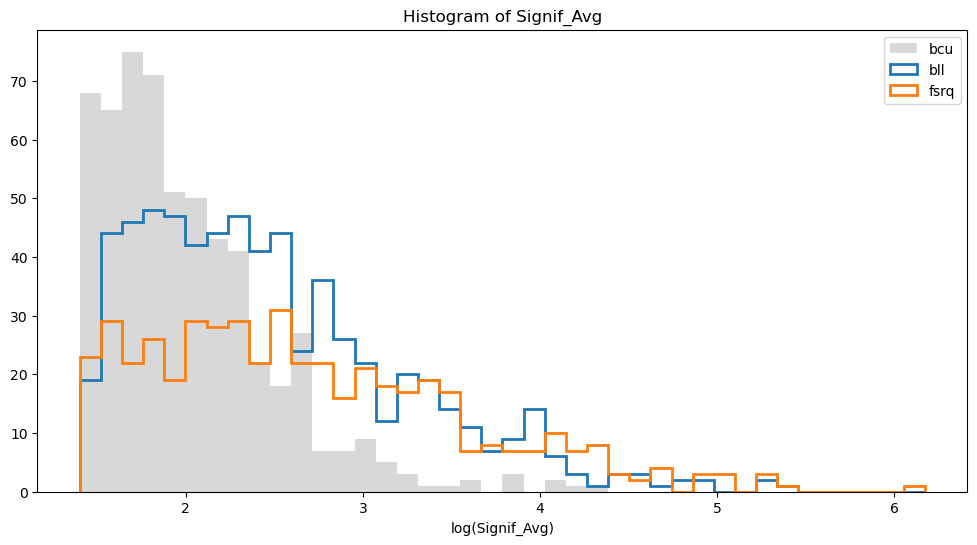

xmin is  4.215152259403639e-16
xmax is  1.3312343449811692e-09
log_xmin is  -35.40267562866211
log_xmax is  -20.437158584594727


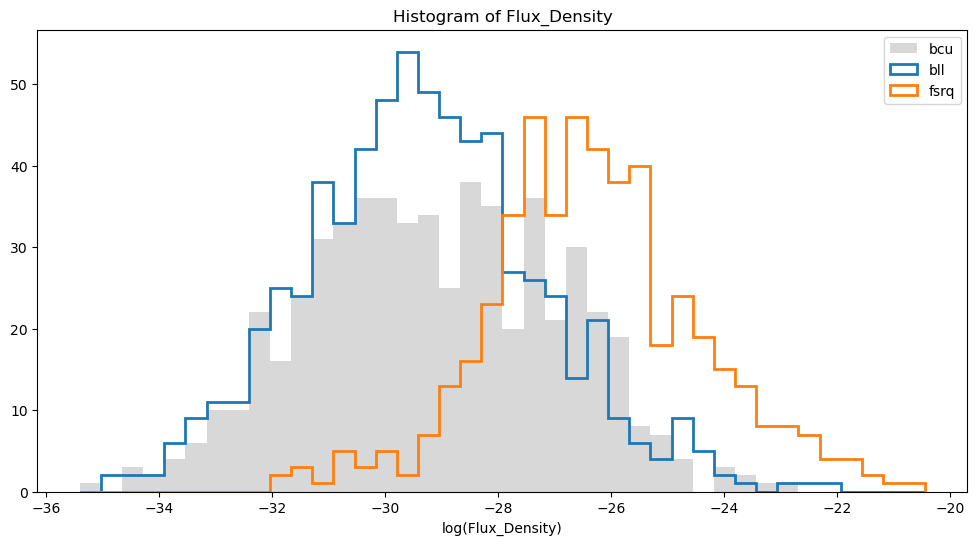

xmin is  8.725302425016679e-11
xmax is  1.0609218747958948e-07
log_xmin is  -23.162208557128906
log_xmax is  -16.058958053588867


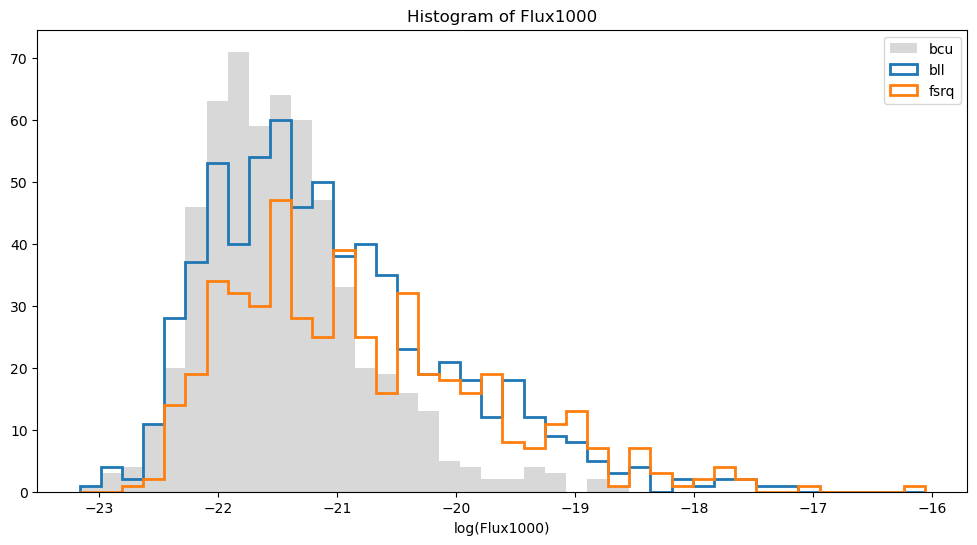

xmin is  1.6522738038871054e-12
xmax is  1.2341760946554814e-09
log_xmin is  -27.128868103027344
log_xmax is  -20.512863159179688


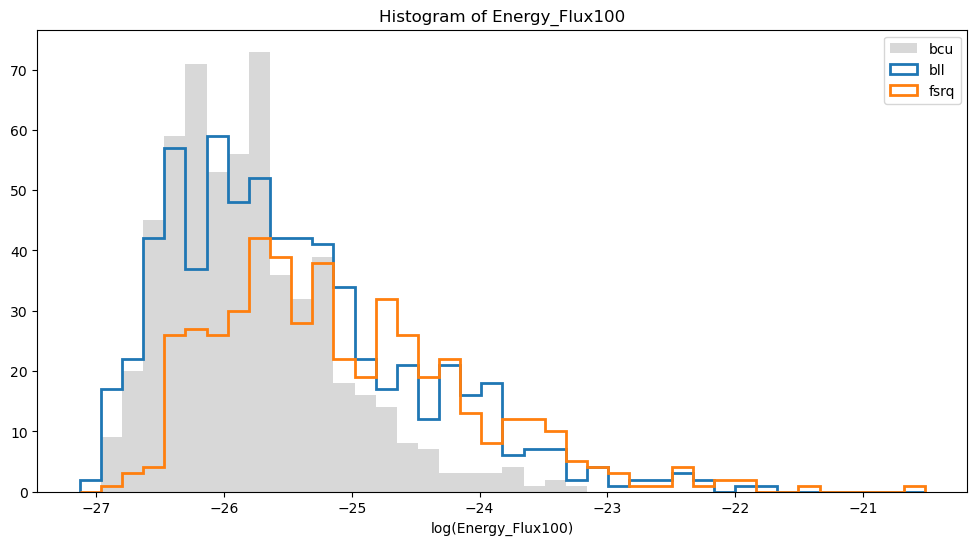

xmin is  0.0
xmax is  18.208187103271484
log_xmin is  None
log_xmax is  2.9018714427948


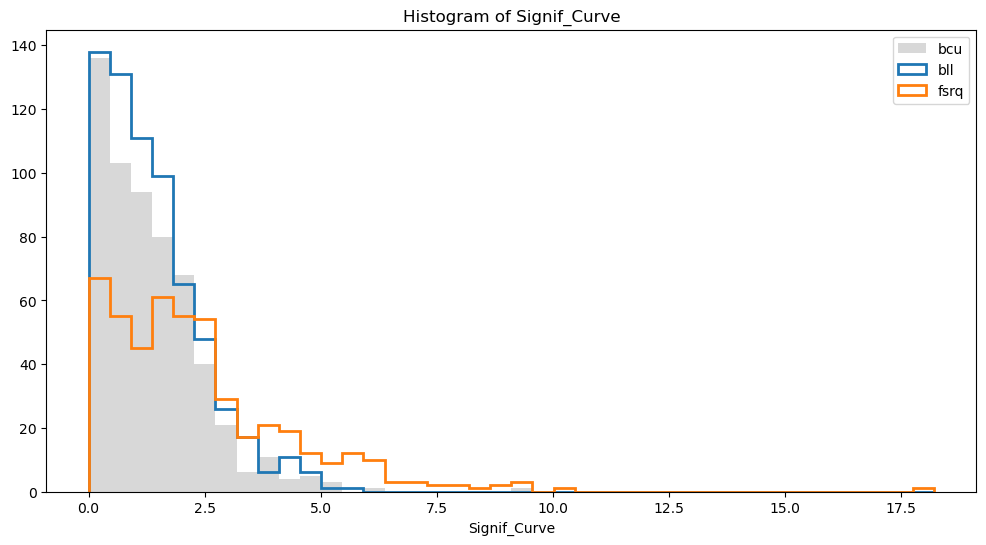

xmin is  1.1322581768035889
xmax is  3.099799633026123
log_xmin is  0.12421402335166931
log_xmax is  1.1313375234603882


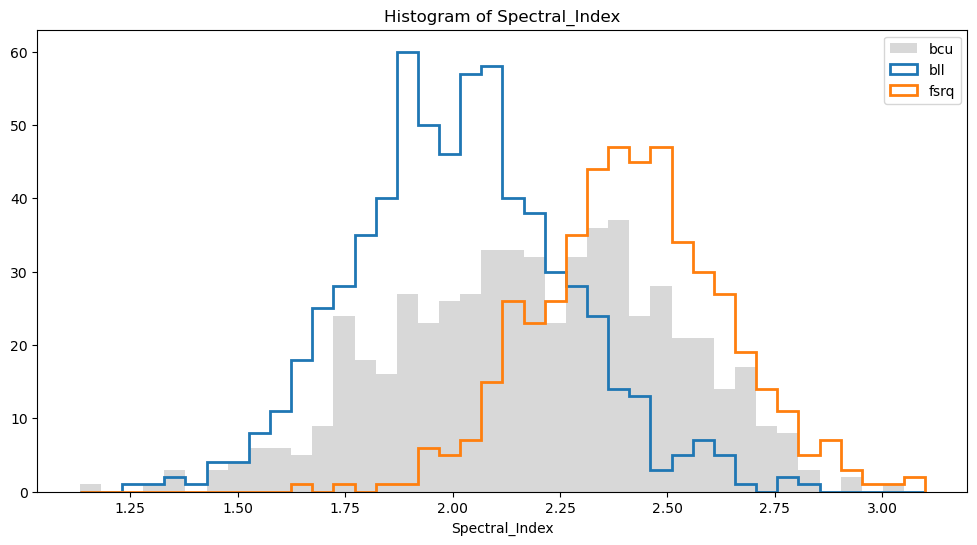

xmin is  0.0303980503231287
xmax is  0.9999999403953552
log_xmin is  -3.4933767318725586
log_xmax is  -5.960464477539063e-08


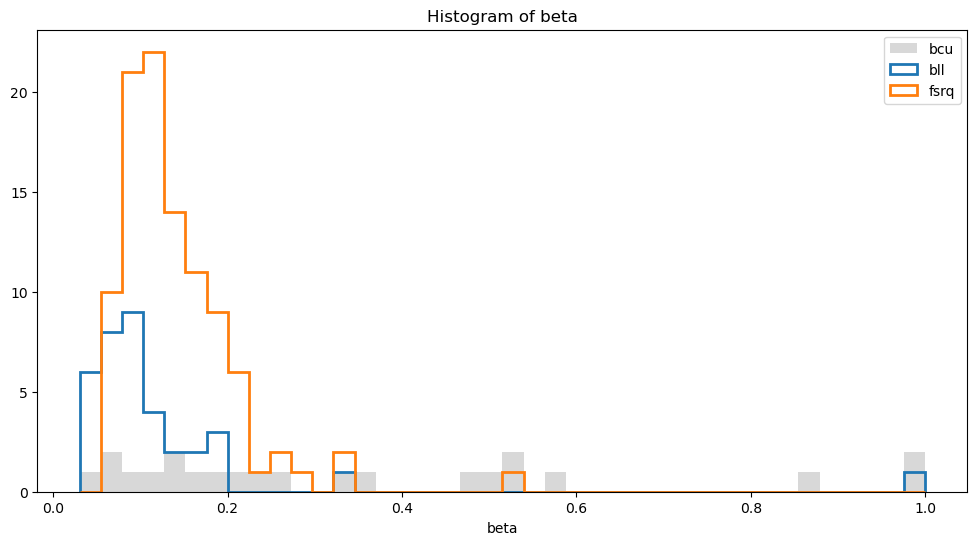

xmin is  1.1322581768035889
xmax is  3.099799633026123
log_xmin is  0.12421402335166931
log_xmax is  1.1313375234603882


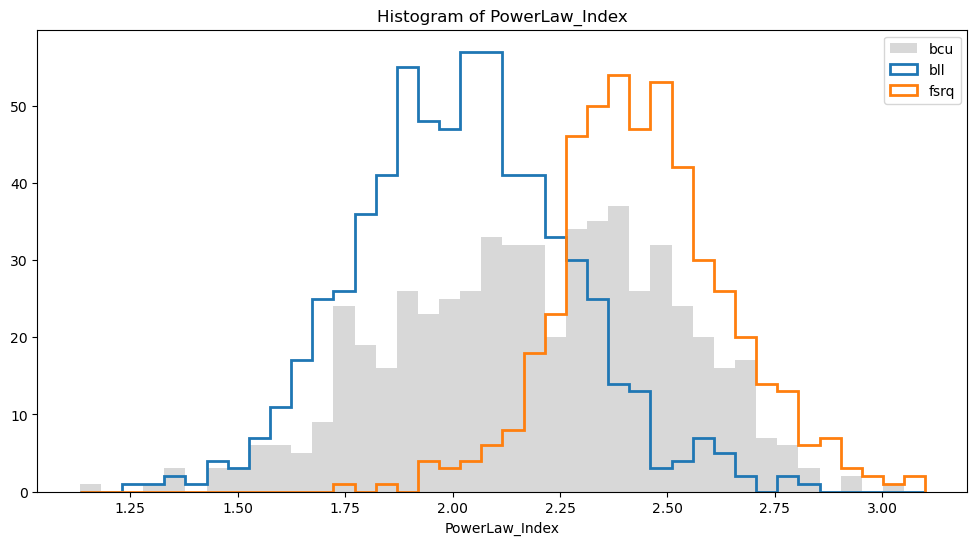

xmin is  22.942794799804688
xmax is  60733.921875
log_xmin is  3.1330039501190186
log_xmax is  11.014257431030273


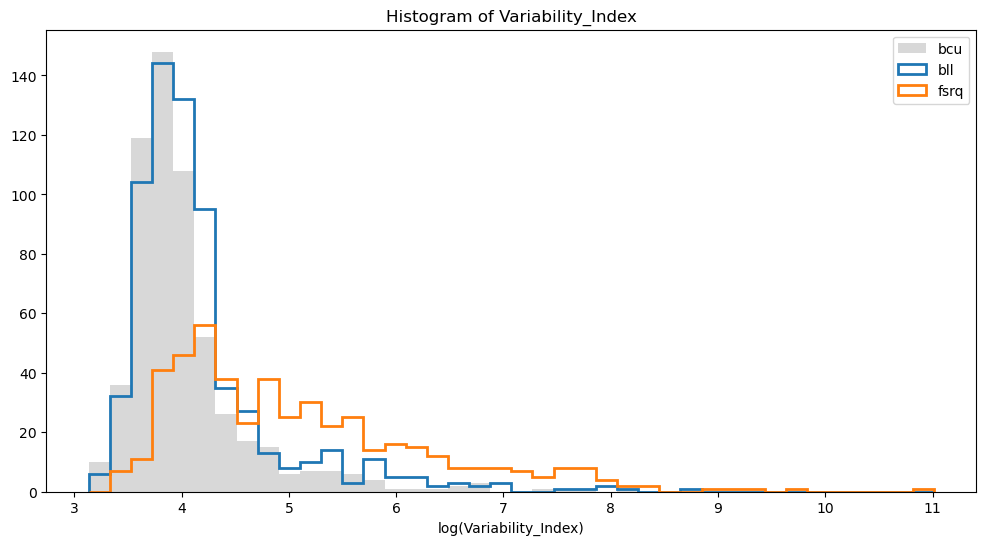

xmin is  462.93621826171875
xmax is  38705.33203125
log_xmin is  6.137589454650879
log_xmax is  10.563733100891113


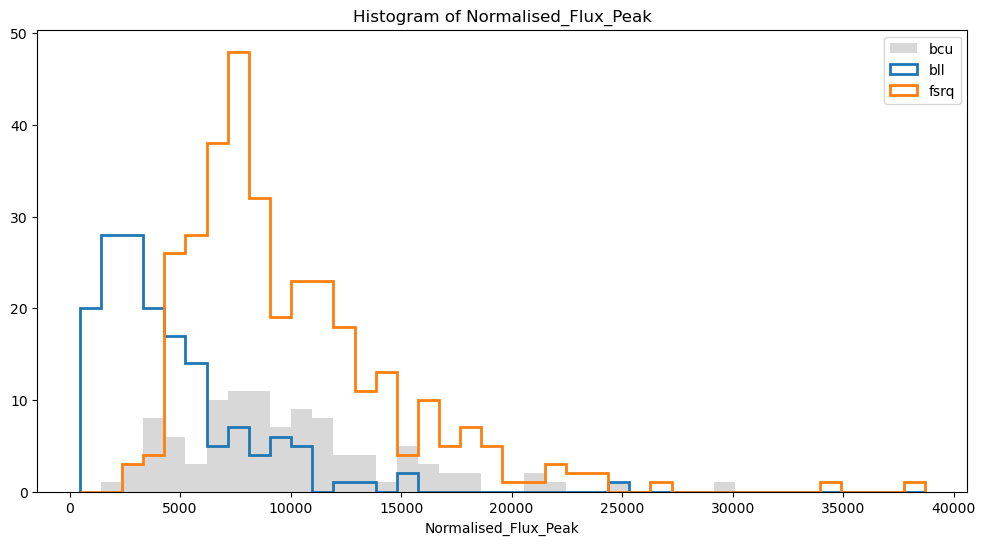

xmin is  2527550.0
xmax is  2630000.0
log_xmin is  14.74276065826416
log_xmax is  14.78249454498291


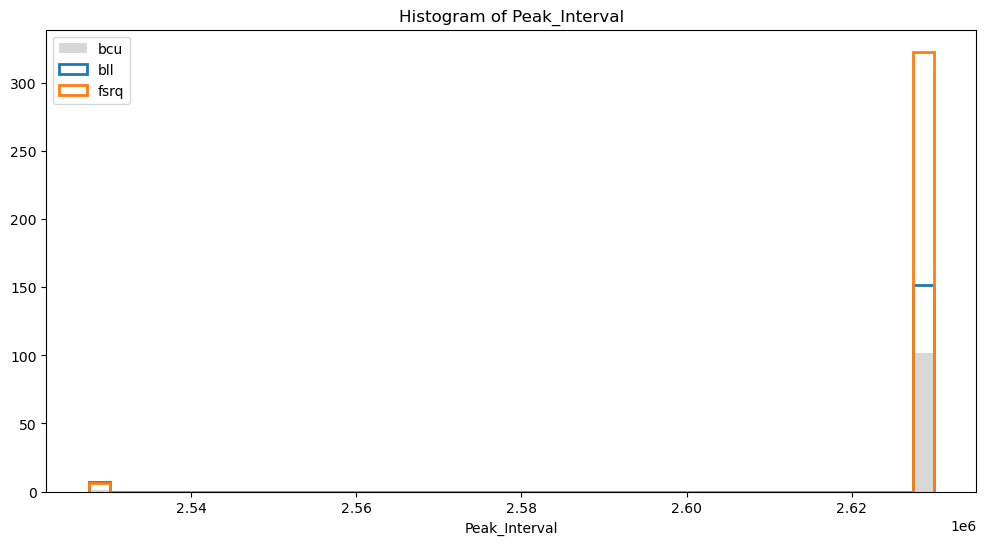

xmin is  -0.3649747967720032
xmax is  0.11235819011926651
log_xmin is  None
log_xmax is  -2.186063289642334


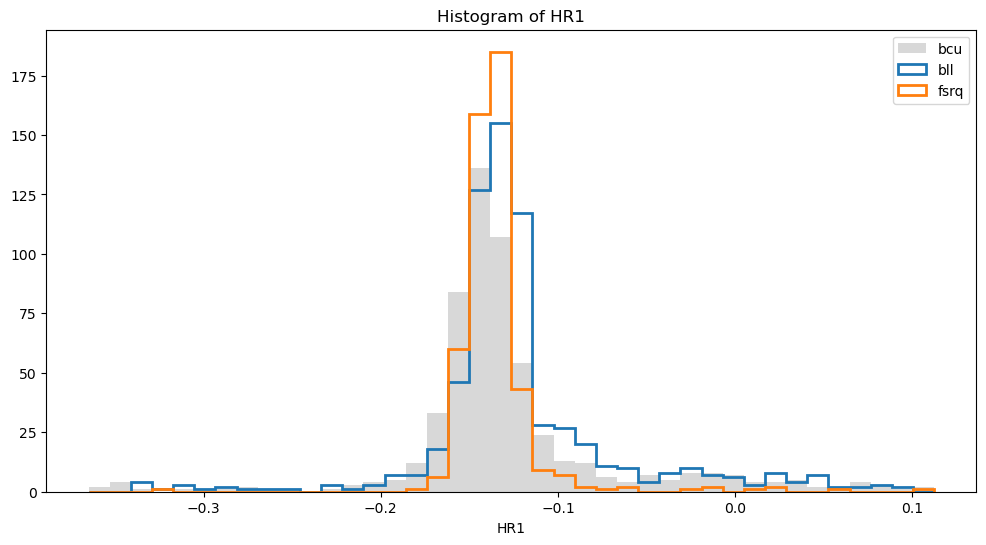

xmin is  -0.27616479992866516
xmax is  0.11548144370317459
log_xmin is  None
log_xmax is  -2.1586453914642334


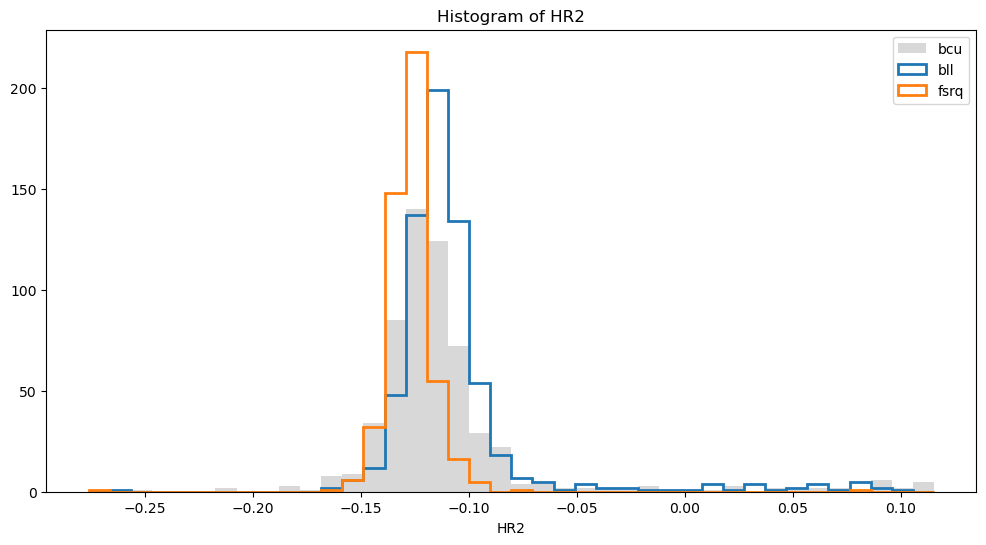

xmin is  -0.29465559124946594
xmax is  0.11805371940135956
log_xmin is  None
log_xmax is  -2.136615514755249


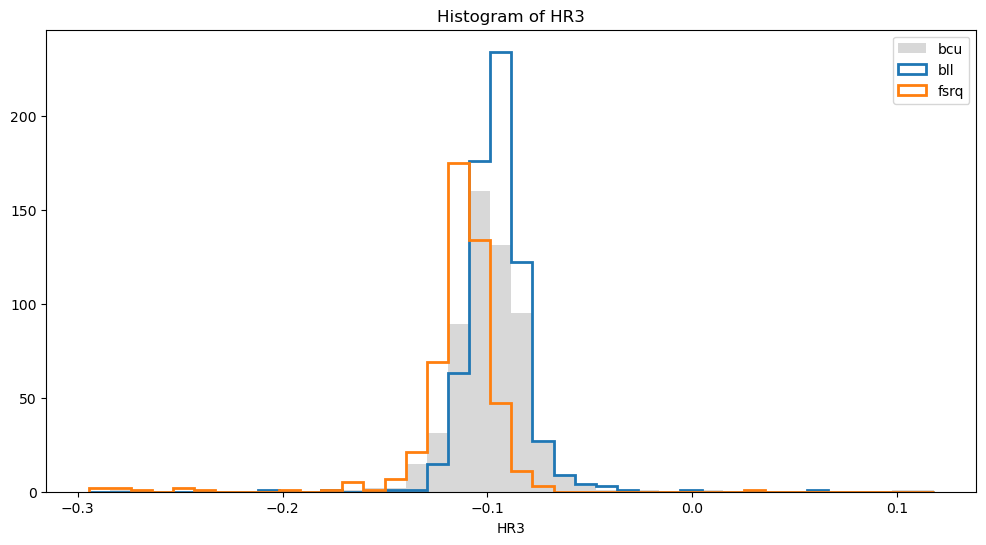

xmin is  -0.30656781792640686
xmax is  0.0392296276986599
log_xmin is  None
log_xmax is  -3.2383229732513428


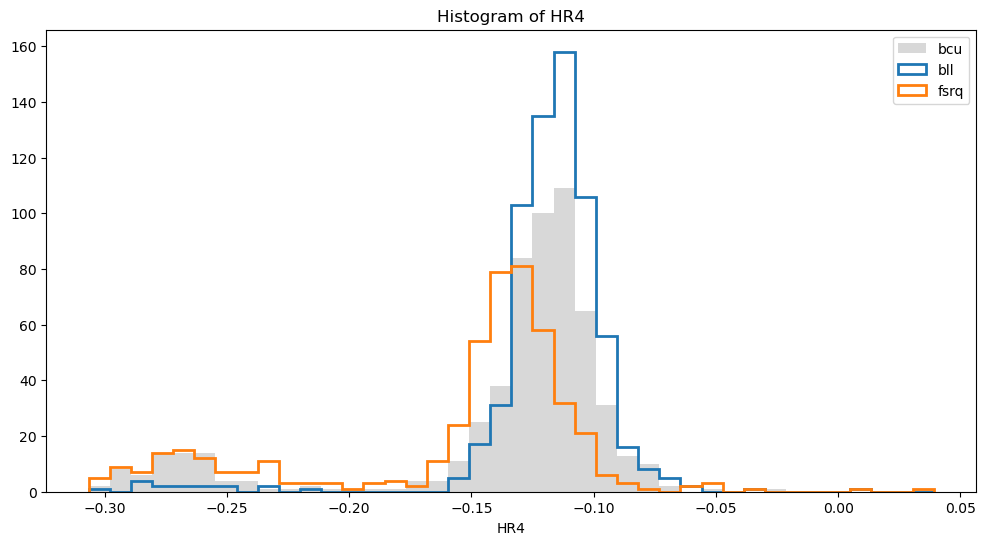

xmin is  -0.477336585521698
xmax is  0.31530874967575073
log_xmin is  None
log_xmax is  -1.154202938079834


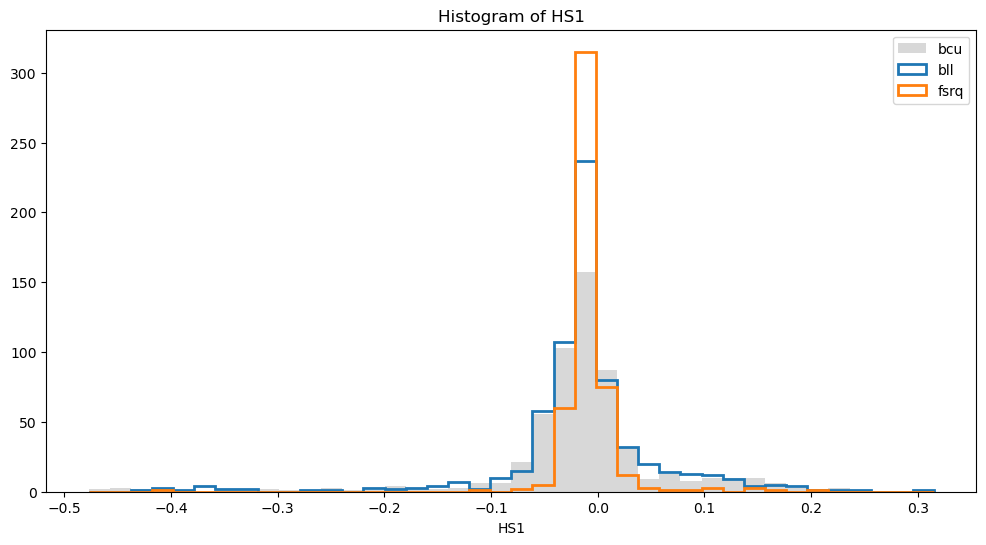

xmin is  -0.3617885708808899
xmax is  0.208431676030159
log_xmin is  None
log_xmax is  -1.5681439638137817


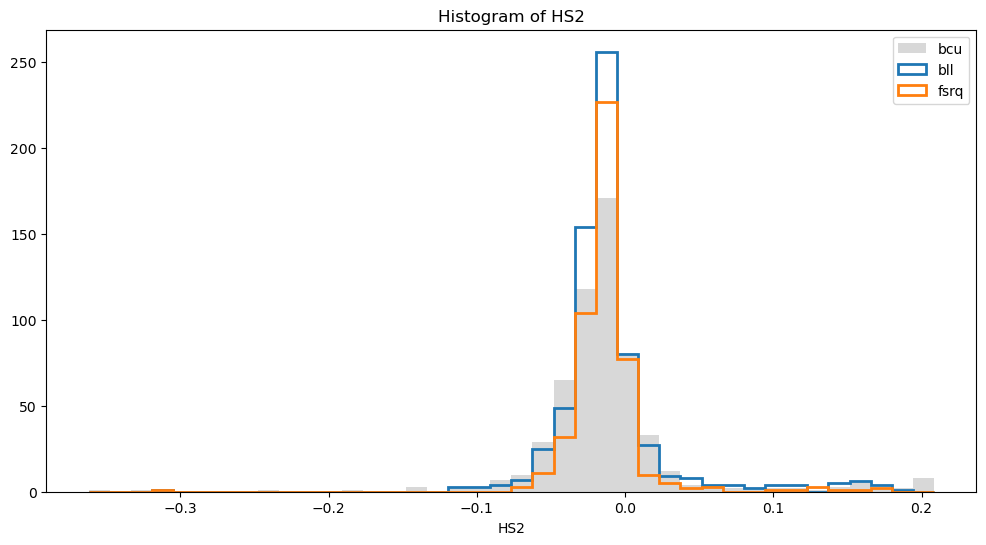

xmin is  -0.3283986747264862
xmax is  0.25481733679771423
log_xmin is  None
log_xmax is  -1.3672083616256714


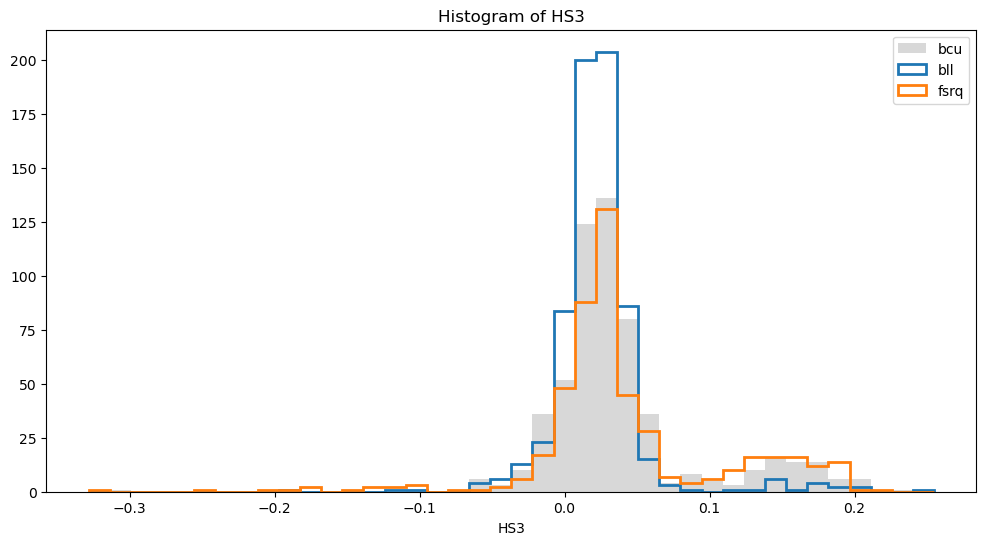

In [13]:
# Graphing features
features = [
    "Signif_Avg",
    "Flux_Density",
    "Flux1000",
    "Energy_Flux100",
    "Signif_Curve",
    "Spectral_Index",
    "beta",
    "PowerLaw_Index",
    "Variability_Index",
    "Normalised_Flux_Peak",
    "Peak_Interval",
    "HR1",
    "HR2",
    "HR3",
    "HR4",
    "HS1",
    "HS2",
    "HS3"
    
]

log_features = [
    "Signif_Avg",
    "Flux_Density", #dont need to graph loggedFlux_density because it is covered here
    "Flux1000",
    "Energy_Flux100",
    "Variability_Index"
]

for feature in features:
     # Use .colnames to check column names in Astropy Table
        data_bll = blazarTable[feature][mask_bll]
        data_fsrq = blazarTable[feature][mask_fsrq]
        data_bcu = blazarTable[feature][mask_bcu]

        # find min and max values, ignoring nan values
        xmin = np.nanmin(blazarTable[feature])
        xmax = np.nanmax(blazarTable[feature])
    
        if xmin <= 0:
            log_xmin = None
        else:
            log_xmin = np.log(xmin)
            
        if xmax <= 0:
            log_xmax = None
        else:
            log_xmax = np.log(xmax)
        print(f'xmin is  {xmin}')
        print(f'xmax is  {xmax}')
        print(f'log_xmin is  {log_xmin}')
        print(f'log_xmax is  {log_xmax}')
    
        plt.figure(figsize=(12, 6))
        if feature in log_features:
            plt.hist(np.log(data_bcu), bins=40, range=(log_xmin,log_xmax), alpha=0.3, label='bcu', color='grey')
            plt.hist(np.log(data_bll), bins=40, range=(log_xmin,log_xmax), label='bll',  histtype='step', lw=2)
            plt.hist(np.log(data_fsrq), bins=40, range=(log_xmin,log_xmax), label='fsrq',  histtype='step', lw=2)
            plt.xlabel(f'log({feature})')
        else:
            # plt.hist(data_bll, bins=40, range=(xmin,xmax), alpha=0.5, label='bll', edgecolor='black')
            # plt.hist(data_fsrq, bins=40, range=(xmin,xmax), alpha=0.5, label='fsrq', edgecolor='black')
            # plt.hist(data_bcu, bins=40, range=(xmin,xmax), alpha=0.5, label='bcu', edgecolor='black')
            plt.hist(data_bcu, bins=40, range=(xmin,xmax), alpha=0.3, label='bcu', color='grey')
            plt.hist(data_bll, bins=40, range=(xmin,xmax), label='bll', histtype='step', lw=2)
            plt.hist(data_fsrq, bins=40, range=(xmin,xmax), label='fsrq', histtype='step', lw=2)
            plt.xlabel(feature)
        plt.legend()
        plt.title(f'Histogram of {feature}')
        plt.show()



Graph scatter plots of all features vs all other features to see the visual distribution of BL Lacs, FSRQs, and BCUs between features

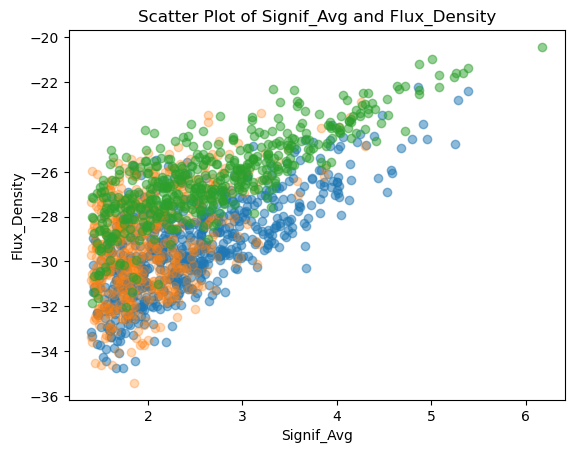

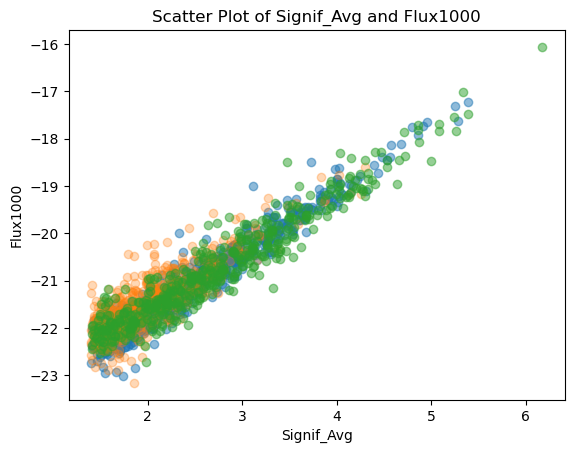

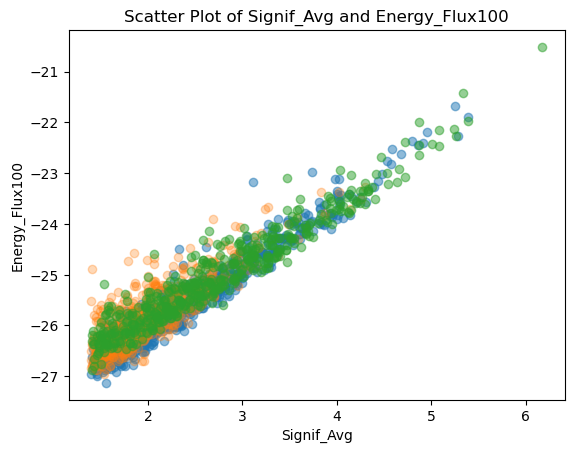

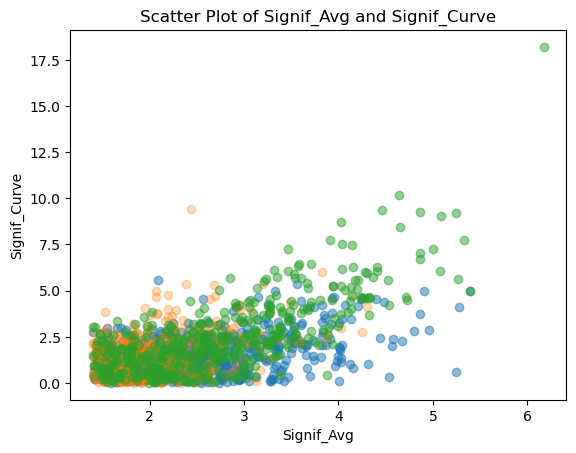

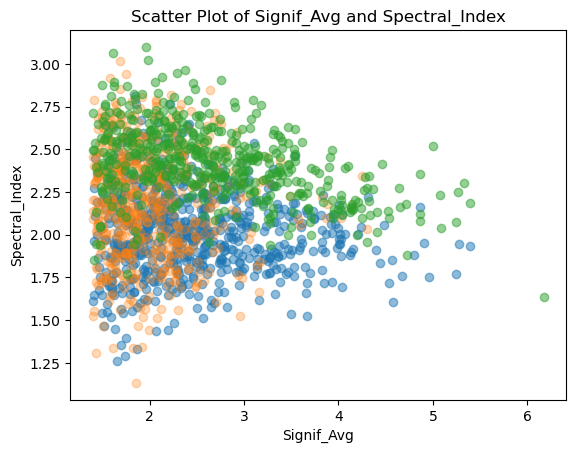

...

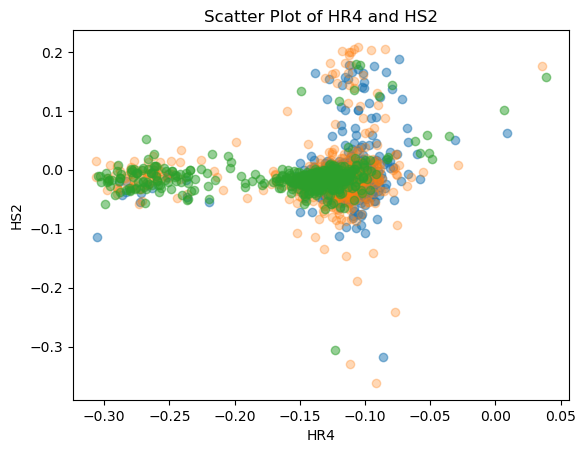

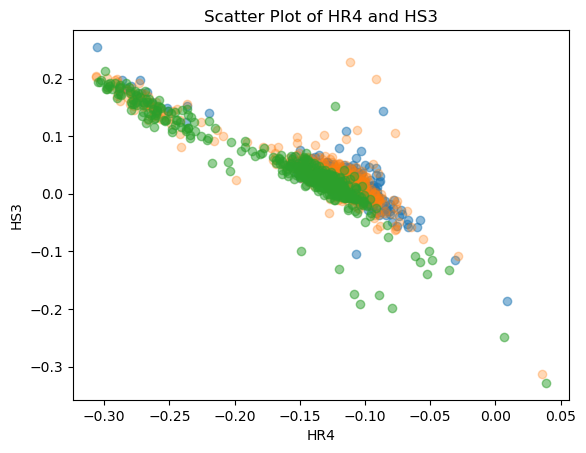

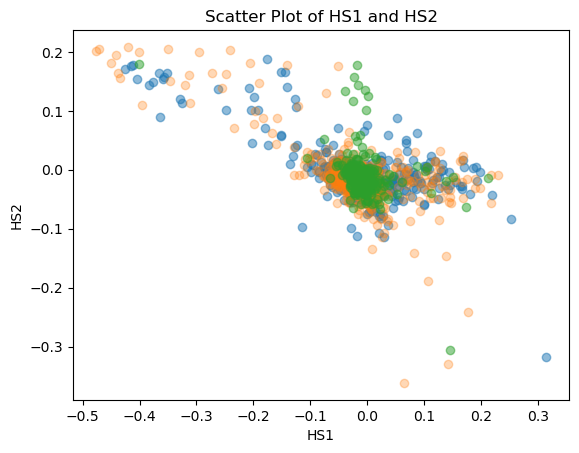

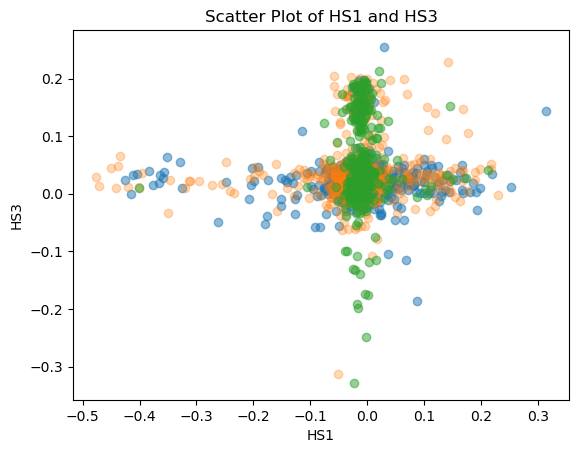

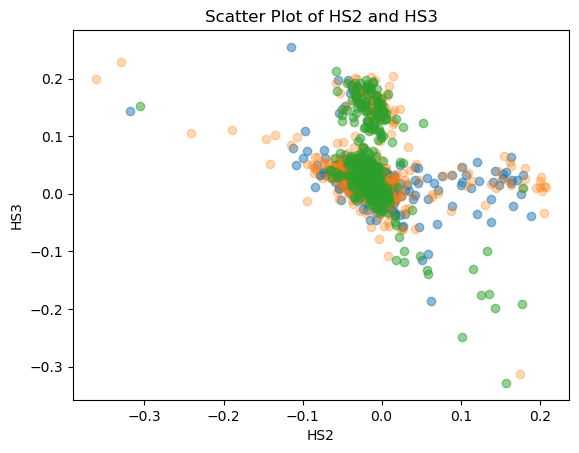

In [14]:
# scatter plots of all graphs
features = [
    "Signif_Avg",
    "Flux_Density",
    "Flux1000",
    "Energy_Flux100",
    "Signif_Curve",
    "Spectral_Index",
    "beta",
    "PowerLaw_Index",
    "Variability_Index",
    "Normalised_Flux_Peak",
    "Peak_Interval",
    "HR1",
    "HR2",
    "HR3",
    "HR4",
    "HS1",
    "HS2",
    "HS3"
]

log_features = [
    "Signif_Avg",
    "Flux_Density",
    "Flux1000",
    "Energy_Flux100",
    "Variability_Index"
]

for i, x_axis in enumerate(features):
    for j, y_axis in enumerate(features):
        if i < j:
            x_bll_points = blazarTable[mask_bll][x_axis]
            y_bll_points = (blazarTable[mask_bll][y_axis])
            x_fsrq_points = blazarTable[mask_fsrq][x_axis]
            y_fsrq_points = (blazarTable[mask_fsrq][y_axis])
            x_bcu_points = blazarTable[mask_bcu][x_axis]
            y_bcu_points = (blazarTable[mask_bcu][y_axis])


            if x_axis in log_features:
                x_bll_points = np.log(x_bll_points)
                x_fsrq_points = np.log(x_fsrq_points)
                x_bcu_points = np.log(x_bcu_points)
                
            if y_axis in log_features:
                y_bll_points = np.log(y_bll_points)
                y_fsrq_points = np.log(y_fsrq_points)
                y_bcu_points = np.log(y_bcu_points)
                
            plt.title(f'Scatter Plot of {x_axis} and {y_axis}')
            plt.plot(x_bll_points, y_bll_points, 'o', alpha=0.5)
            plt.plot(x_bcu_points, y_bcu_points, 'o', alpha=0.3)
            plt.plot(x_fsrq_points, y_fsrq_points, 'o', alpha=0.5)
            
            plt.xlabel(x_axis)
            plt.ylabel(y_axis)
            plt.show()

Graph scatter plots of just hardness slope values to see the visual distribution of BL Lacs, FSRQs, and BCUs

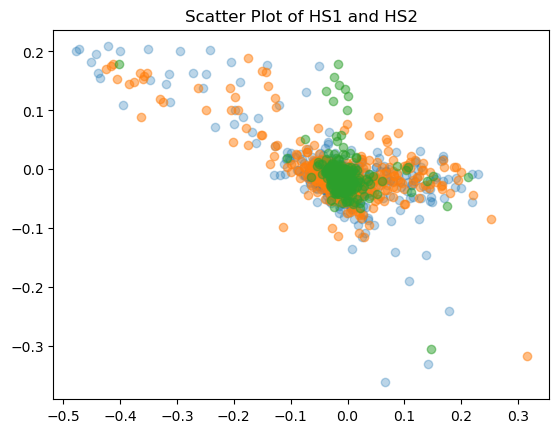

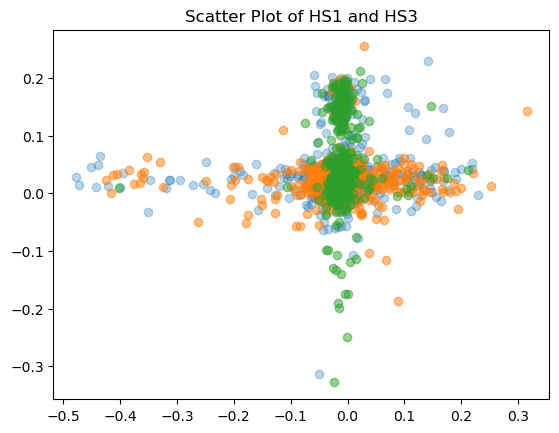

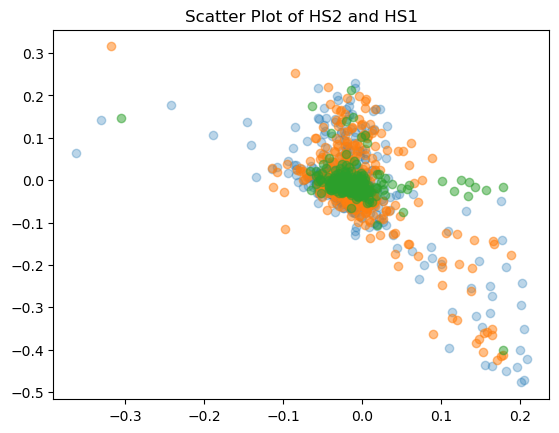

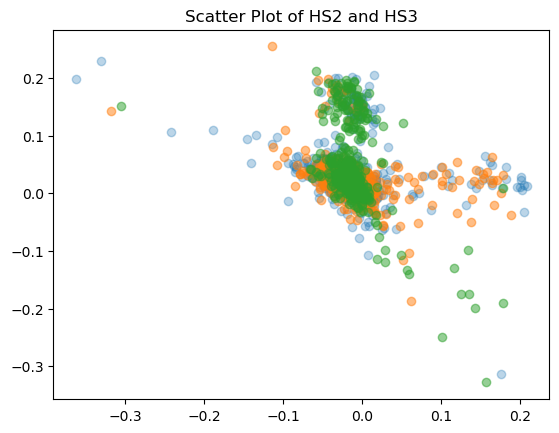

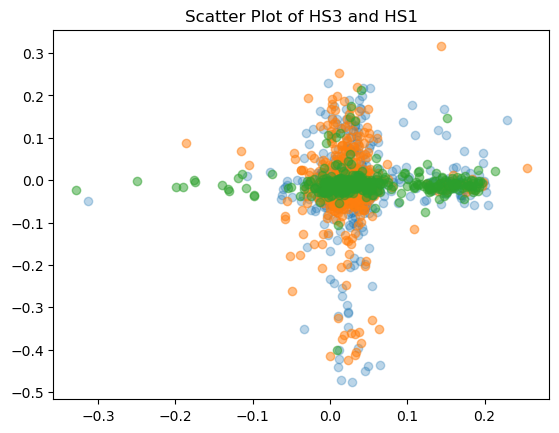

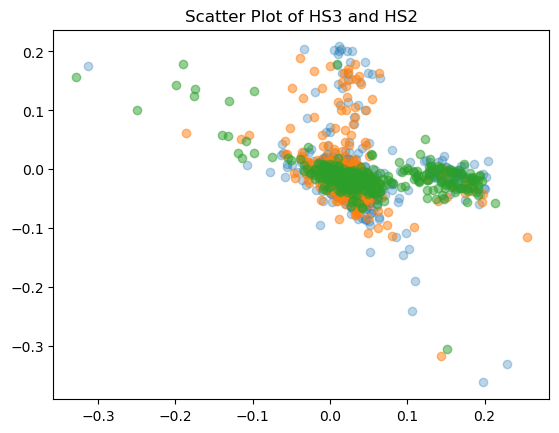

In [15]:
# scatter plot of the Hardness slopes
hardness_slopes = [
    "HS1",
    "HS2",
    "HS3"
]
for xHS in hardness_slopes:
    for yHS in hardness_slopes:
        if xHS != yHS:
          plt.title(f'Scatter Plot of {xHS} and {yHS}')
          plt.plot(blazarTable[mask_bcu][xHS], (blazarTable[mask_bcu][yHS]), 'o', alpha=0.3)
          plt.plot(blazarTable[mask_bll][xHS], (blazarTable[mask_bll][yHS]), 'o', alpha=0.5)
          plt.plot(blazarTable[mask_fsrq][xHS], (blazarTable[mask_fsrq][yHS]), 'o', alpha=0.5)
          
          plt.show()

Graph histogram plots of the flux bins, HR bins, and HS bins, to visually compare how combining features affects the distribution of BL Lacs, FSRQs, and BCUs

xmin is  1.002220225213013e-14
xmax is  1.7635265976423398e-06
log_xmin is  -32.23397445678711
log_xmax is  -13.248194694519043


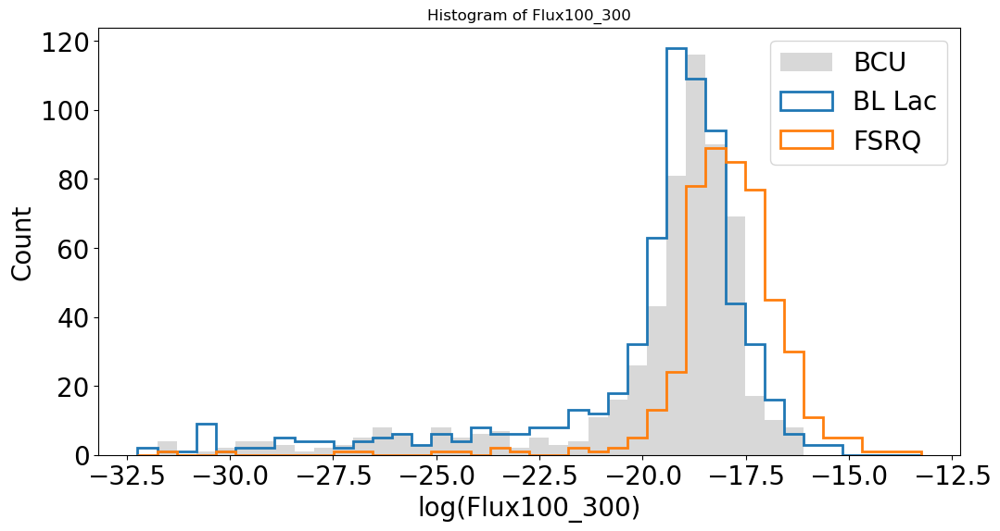

xmin is  3.977879325575955e-15
xmax is  5.04966067182977e-07
log_xmin is  -33.15802764892578
log_xmax is  -14.498774528503418


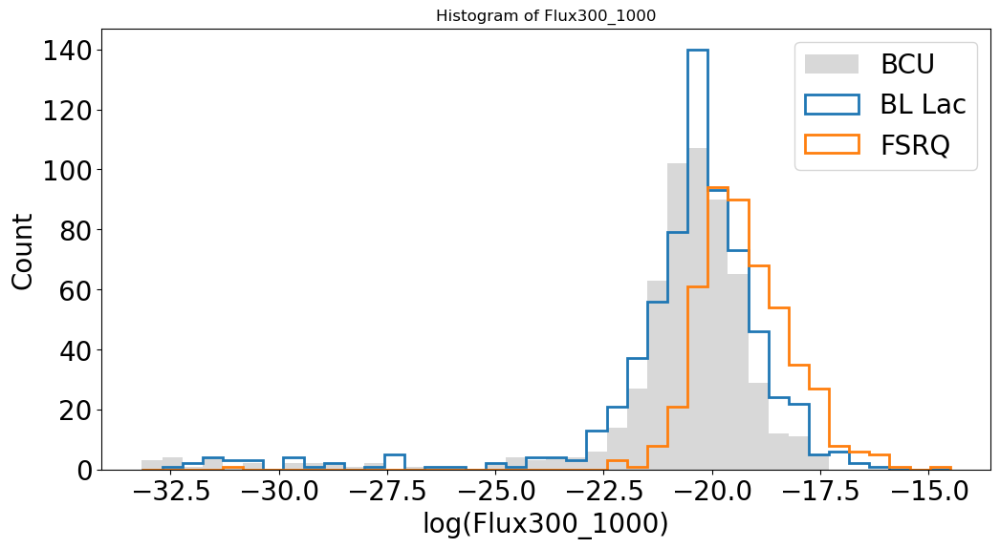

xmin is  1.8022597422019974e-15
xmax is  8.91912748102186e-08
log_xmin is  -33.94973373413086
log_xmax is  -16.23248291015625


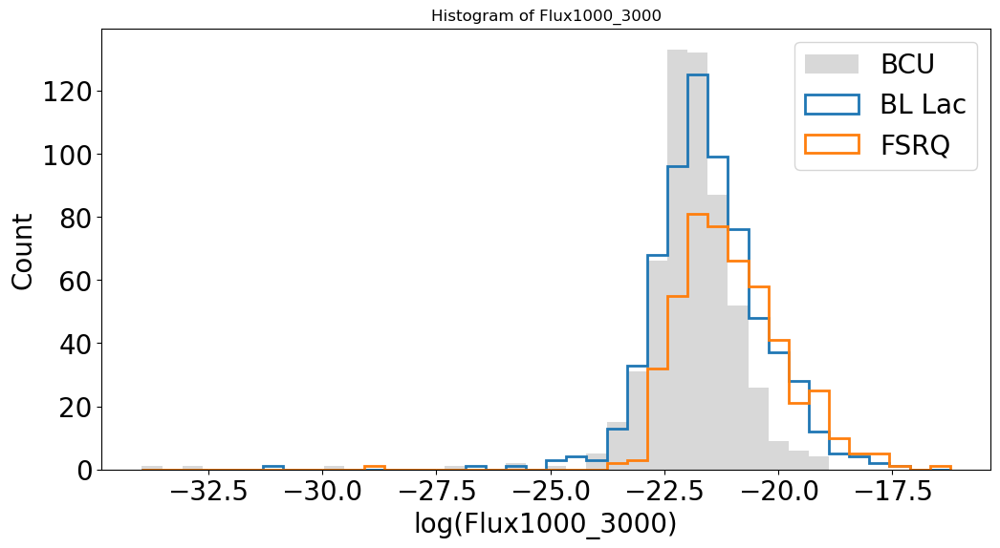

xmin is  9.338969171490577e-16
xmax is  1.498159818424938e-08
log_xmin is  -34.6071662902832
log_xmax is  -18.016443252563477


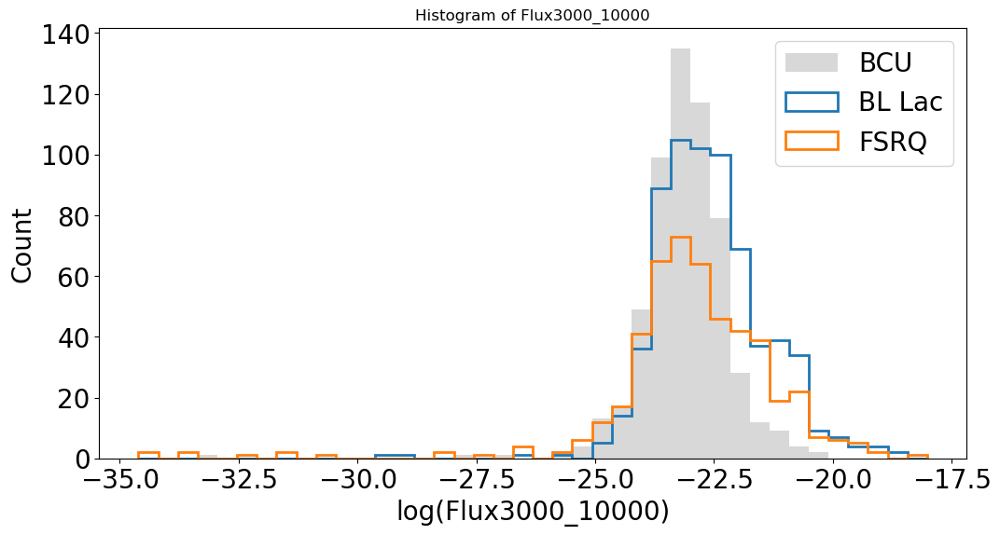

xmin is  1.7382340304964821e-16
xmax is  4.260642505471424e-09
log_xmin is  -36.288490295410156
log_xmax is  -19.273845672607422


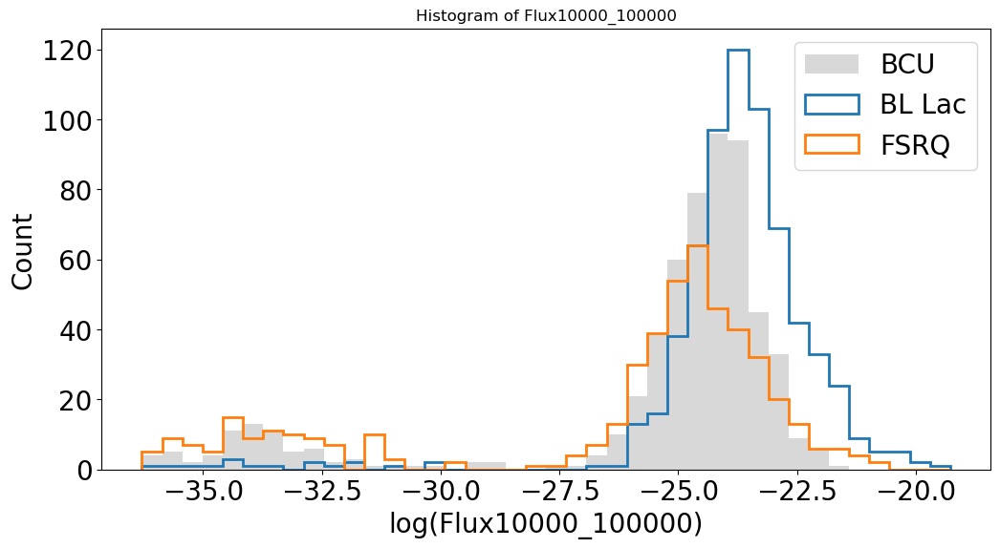

xmin is  -0.3649747967720032
xmax is  0.11235819011926651
log_xmin is  None
log_xmax is  -2.186063289642334


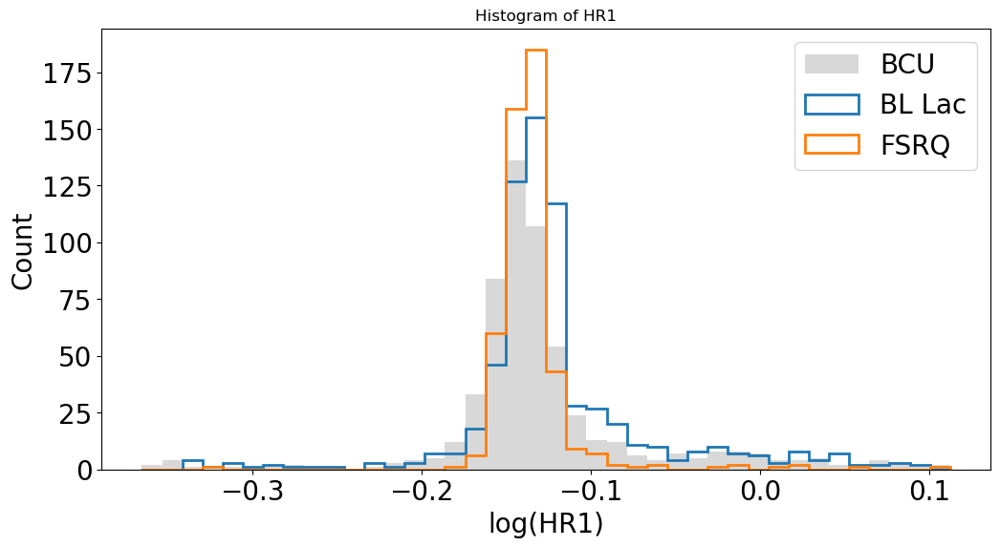

xmin is  -0.27616479992866516
xmax is  0.11548144370317459
log_xmin is  None
log_xmax is  -2.1586453914642334


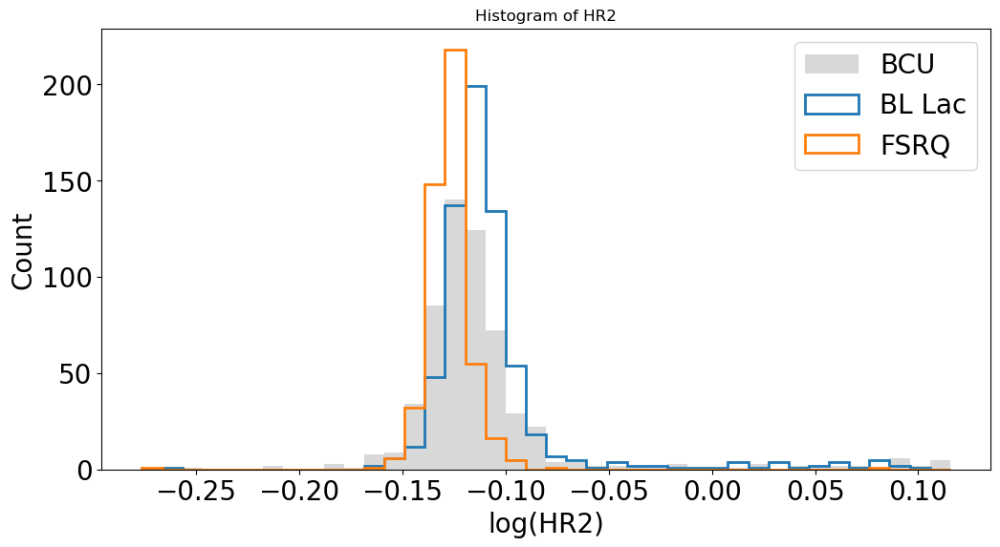

xmin is  -0.29465559124946594
xmax is  0.11805371940135956
log_xmin is  None
log_xmax is  -2.136615514755249


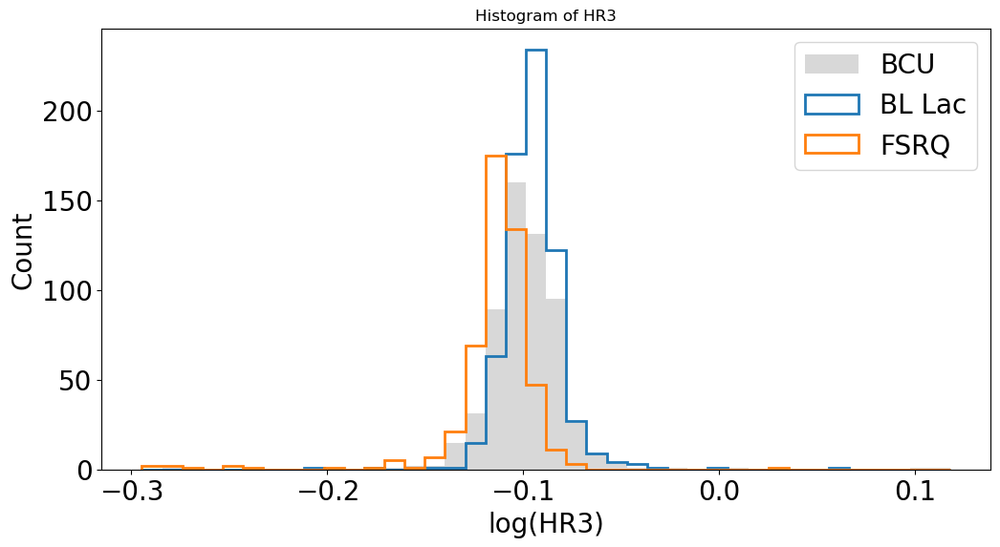

xmin is  -0.30656781792640686
xmax is  0.0392296276986599
log_xmin is  None
log_xmax is  -3.2383229732513428


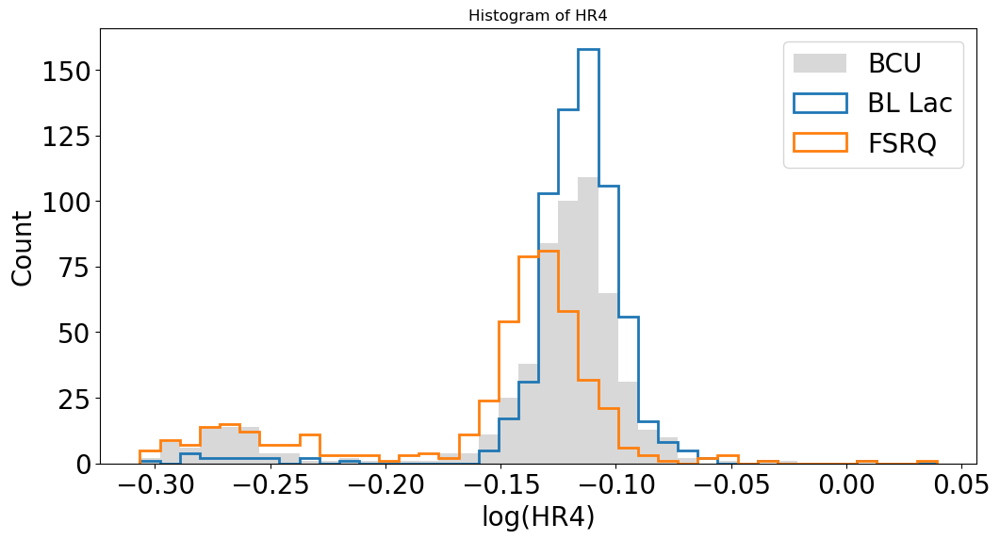

xmin is  -0.477336585521698
xmax is  0.31530874967575073
log_xmin is  None
log_xmax is  -1.154202938079834


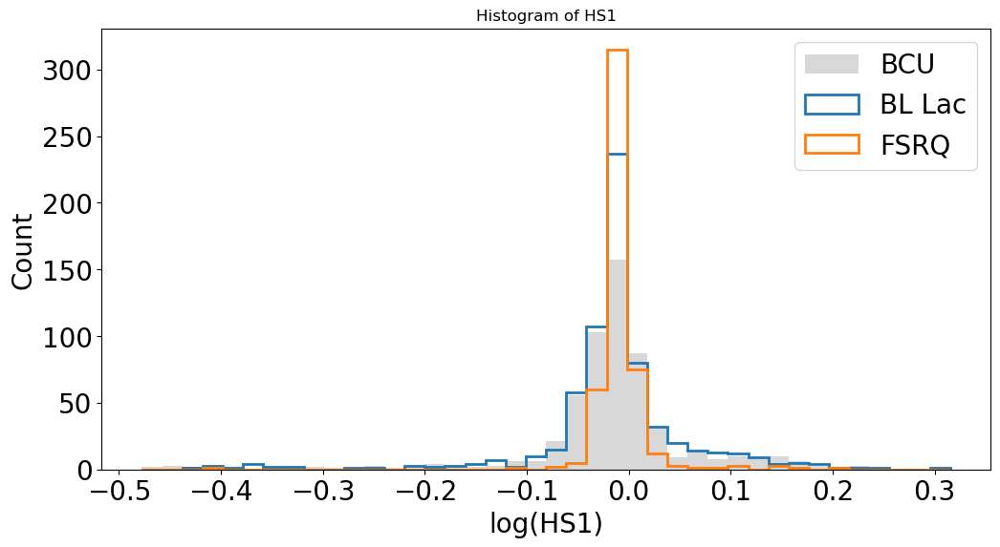

xmin is  -0.3617885708808899
xmax is  0.208431676030159
log_xmin is  None
log_xmax is  -1.5681439638137817


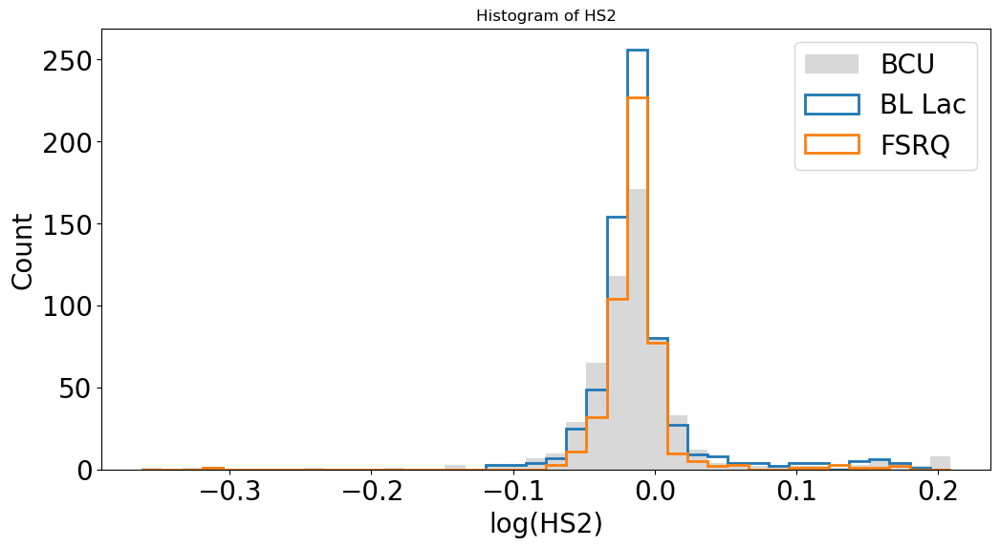

xmin is  -0.3283986747264862
xmax is  0.25481733679771423
log_xmin is  None
log_xmax is  -1.3672083616256714


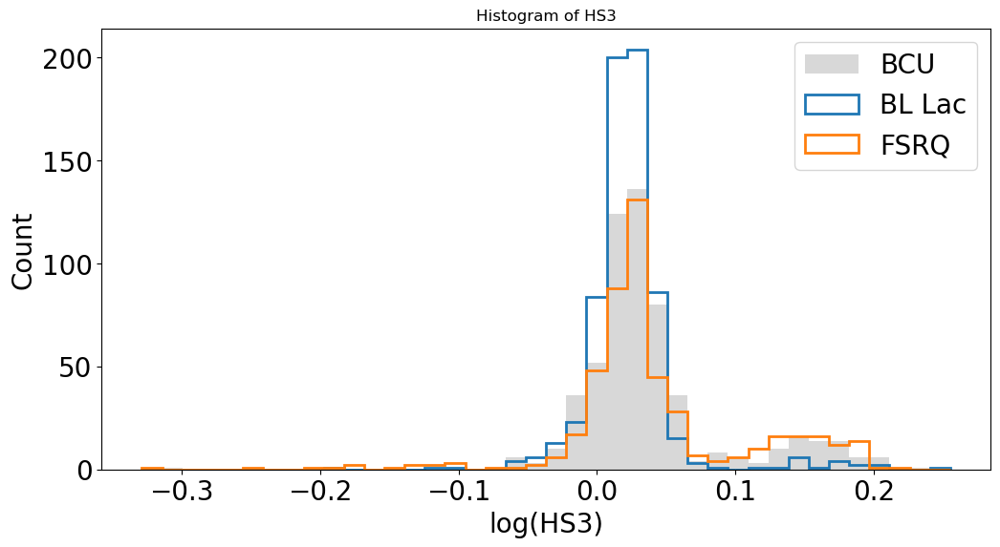

In [16]:
# comparing how graphs of the fluxes vs the HR compare
# Graphing features
features = [
    "Flux100_300",
    "Flux300_1000",
    "Flux1000_3000",
    "Flux3000_10000",
    "Flux10000_100000",
    "HR1",
    "HR2",
    "HR3",
    "HR4",
    "HS1",
    "HS2",
    "HS3"
]

log_features = [
    "Flux100_300",
    "Flux300_1000",
    "Flux1000_3000",
    "Flux3000_10000",
    "Flux10000_100000"
]

for feature in features:
     # Use .colnames to check column names in Astropy Table
        data_bll = blazarTable[feature][mask_bll]
        data_fsrq = blazarTable[feature][mask_fsrq]
        data_bcu = blazarTable[feature][mask_bcu]

        # find min and max values, ignoring nan values
        xmin = np.nanmin(blazarTable[feature])
        xmax = np.nanmax(blazarTable[feature])
    
        if xmin <= 0:
            log_xmin = None
        else:
            log_xmin = np.log(xmin)
            
        if xmax <= 0:
            log_xmax = None
        else:
            log_xmax = np.log(xmax)
        print(f'xmin is  {xmin}')
        print(f'xmax is  {xmax}')
        print(f'log_xmin is  {log_xmin}')
        print(f'log_xmax is  {log_xmax}')
    
        plt.figure(figsize=(12, 6))
        if feature in log_features:
            plt.hist(np.log(data_bcu), bins=40, range=(log_xmin,log_xmax), alpha=0.3, label='BCU', color='grey')
            plt.hist(np.log(data_bll), bins=40, range=(log_xmin,log_xmax), label='BL Lac',  histtype='step', lw=2)
            plt.hist(np.log(data_fsrq), bins=40, range=(log_xmin,log_xmax), label='FSRQ',  histtype='step', lw=2)
        
            plt.xlabel(f'log({feature})', fontsize=20)
        else:
            plt.hist(data_bcu, bins=40, range=(xmin,xmax), alpha=0.3, label='BCU', color='grey')
            plt.hist(data_bll, bins=40, range=(xmin,xmax), label='BL Lac', histtype='step', lw=2)
            plt.hist(data_fsrq, bins=40, range=(xmin,xmax), label='FSRQ', histtype='step', lw=2)
            
            plt.xlabel(f'log({feature})', fontsize=20)
        plt.legend(fontsize=20)
        plt.ylabel('Count', fontsize=20)
        plt.tick_params(axis='both', which='major', labelsize=20)
        plt.title(f'Histogram of {feature}')
        plt.show()


Determine the normalised mean and standard deviation for the flux bins, HR, and HS graphs to see mathematically from the visual representation in the graphs above how/if the graphs create better splits

In [17]:
# find the mean and standard deviation for Flux, HR and HS
features = [
    "Flux100_300",
    "Flux300_1000",
    "Flux1000_3000",
    "Flux3000_10000",
    "Flux10000_100000",
    "HR1",
    "HR2",
    "HR3",
    "HR4",
    "HS1",
    "HS2",
    "HS3"
]

log_features = [
    "Flux100_300",
    "Flux300_1000",
    "Flux1000_3000",
    "Flux3000_10000",
    "Flux10000_100000",
]
# find mean for bll and fsrq, then find the seperation difference between them
for feature in features:

    # find min and max values, ignoring nan values
    xmin = np.nanmin(blazarTable[feature])
    xmax = np.nanmax(blazarTable[feature])

    if xmin <= 0:
        log_xmin = None
    else:
        log_xmin = np.log(xmin)
        
    if xmax <= 0:
        log_xmax = None
    else:
        log_xmax = np.log(xmax)

    calculated_range = xmax - xmin
    if feature in log_features:
        # Apply log transformation before calculating mean and std
        bll_data = np.log(blazarTable[mask_bll][feature])
        fsrq_data = np.log(blazarTable[mask_fsrq][feature])
        calculated_range = log_xmax - log_xmin
    else:
        bll_data = blazarTable[mask_bll][feature]
        fsrq_data = blazarTable[mask_fsrq][feature]

    bll_mean = bll_data.mean()
    fsrq_mean = fsrq_data.mean()
    bll_std = np.std(bll_data)
    fsrq_std = np.std(fsrq_data)

    bll_std_normalised = bll_std/calculated_range
    fsrq_std_normalised = fsrq_std/calculated_range
    mean_diff = np.abs(bll_mean - fsrq_mean)/calculated_range
    
    print(f"mean for bll {feature} is = {bll_mean}, mean for fsrq {feature} is = {fsrq_mean}, mean difference divided by range = {mean_diff}")
    print(f"std for bll {feature} divided by range is = {bll_std_normalised}, and for fsrq {feature} is = {fsrq_std_normalised}")

# std gets smaller from HR to HS, but bigger from flux to HS
# flux to HR: 
    # mean difference varies: HR1 was less, HR2, HR3, and HR4 were in the middle. 
    # STD varies: HR1 improves, HR2 improves for fsrq and in middle for bll, HR3 improves, and HR4 is in the middle.
    # overall: peaks are further apart in HR that the lower flux, and closer than the higher flux, and the peaks are narrower


# flux to HS: 
    # mean difference varies: HS1 and HS2 decreased, and HS3 increased for flux 1000_3000 and 3000_10,000 and was in the middle for 3000_10,000 and 10,000_100,000
    # STD varies: HS1 decreased for lower flux, and was in the middle bll and decresaed for fsrq in higher flux. HS2 was the middle for bll and decreased for fsrq, HS3 was in middle for fsrq for lower flux, and decreased for everything else.
    # overall: HS peaks varied in distance, and got on average smaller in their width.


# HR to HS: 
    # mean difference: HS1, HS2, HS3 decreases
    # STD: HS1 decreased from HR1, increased from HR2. HS2 decreased from HR2 and decreasd and increased for bll and fsrq respectively from HR3. HS3 increased from HR3 and decreased from HR4.
    # overall: peaks get closer together, STD varies.

mean for bll Flux100_300 is = -19.874706268310547, mean for fsrq Flux100_300 is = -17.958515167236328, mean difference divided by range = 0.10092770308256149
std for bll Flux100_300 divided by range is = 0.15389055013656616, and for fsrq Flux100_300 is = 0.08357603847980499
mean for bll Flux300_1000 is = -20.63768196105957, mean for fsrq Flux300_1000 is = -19.24277687072754, mean difference divided by range = 0.07475674897432327
std for bll Flux300_1000 divided by range is = 0.12292104959487915, and for fsrq Flux300_1000 is = 0.06440315395593643
mean for bll Flux1000_3000 is = -21.521759033203125, mean for fsrq Flux1000_3000 is = -21.011226654052734, mean difference divided by range = 0.028815552592277527
std for bll Flux1000_3000 divided by range is = 0.06823528558015823, and for fsrq Flux1000_3000 is = 0.06701194494962692
mean for bll Flux3000_10000 is = -22.560331344604492, mean for fsrq Flux3000_10000 is = -22.94082260131836, mean difference divided by range = 0.022933976724743843


Graph histogram plots of the Flux_Peak, Energy_Flux100, and Normalied_Flux_Peak to visually compare how combining features affects the distribution of BL Lacs, FSRQs, and BCUs

xmin is  9.64872981512599e-09
xmax is  9.64872981512599e-09


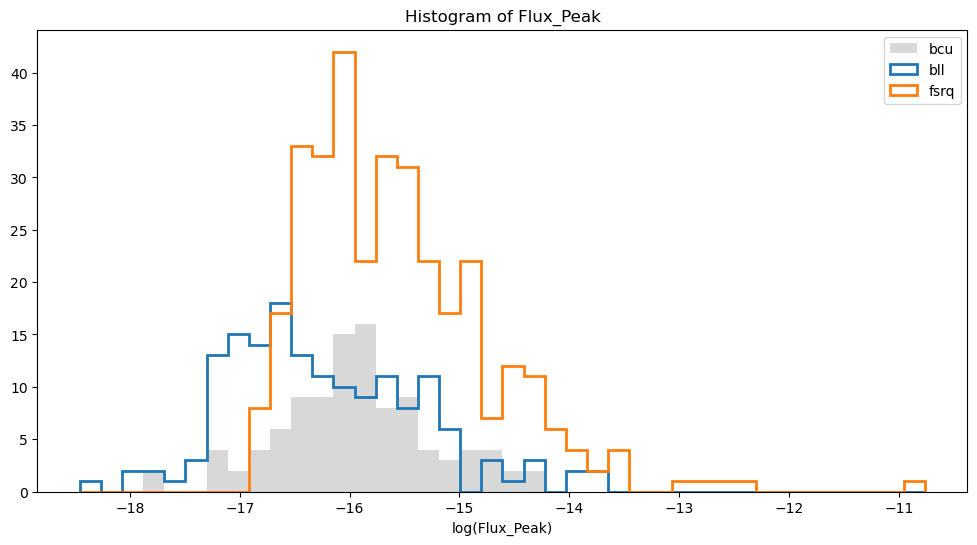

xmin is  1.6522738038871054e-12
xmax is  1.6522738038871054e-12


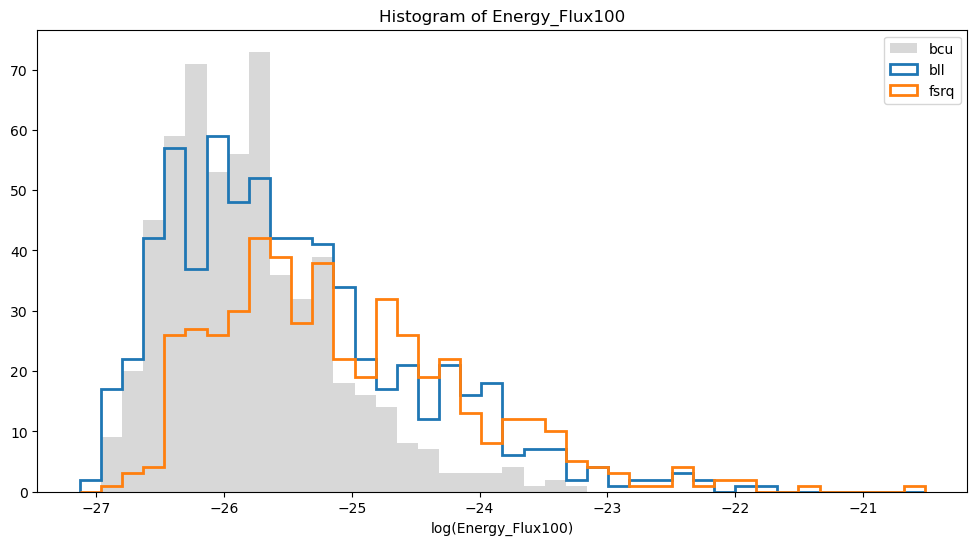

xmin is  462.93621826171875
xmax is  462.93621826171875


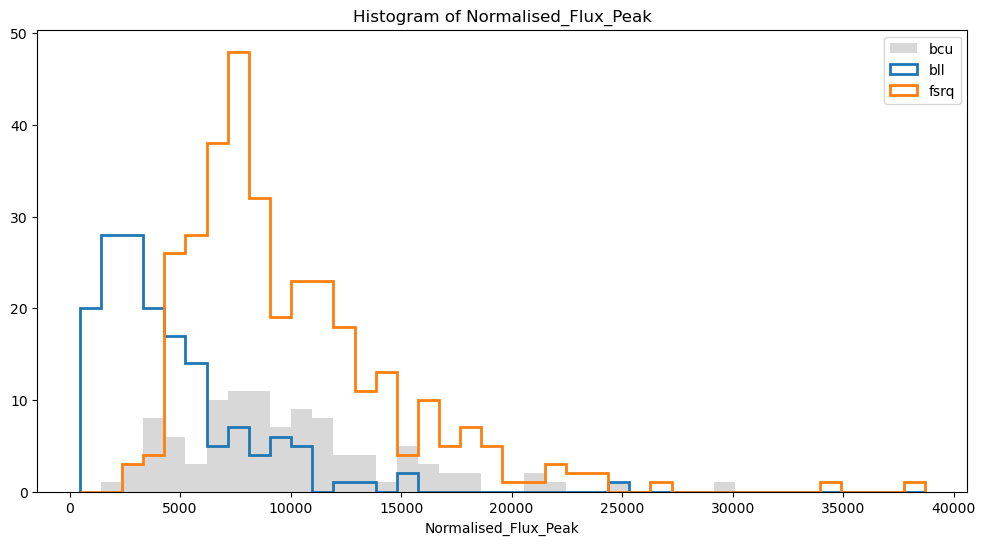

In [18]:
# Graphing features
features = [
    'Flux_Peak',
    'Energy_Flux100',
    'Normalised_Flux_Peak'
]

log_features = [
    'Flux_Peak',
    'Energy_Flux100'
]

for feature in features:
     # Use .colnames to check column names in Astropy Table
        data_bll = blazarTable[feature][mask_bll]
        data_fsrq = blazarTable[feature][mask_fsrq]
        data_bcu = blazarTable[feature][mask_bcu]

        # find min and max values, ignoring nan values
        xmin = np.nanmin(blazarTable[feature])
        xmax = np.nanmax(blazarTable[feature])
    
        if xmin <= 0:
            log_xmin = None
        else:
            log_xmin = np.log(xmin)
            
        if xmax <= 0:
            log_xmax = None
        else:
            log_xmax = np.log(xmax)
        print(f'xmin is  {xmin}')
        print(f'xmax is  {xmin}')
    
        plt.figure(figsize=(12, 6))
        if feature in log_features:
            plt.hist(np.log(data_bcu), bins=40, range=(log_xmin,log_xmax), alpha=0.3, label='bcu', color='grey')
            plt.hist(np.log(data_bll), bins=40, range=(log_xmin,log_xmax), label='bll',  histtype='step', lw=2)
            plt.hist(np.log(data_fsrq), bins=40, range=(log_xmin,log_xmax), label='fsrq',  histtype='step', lw=2)
            plt.xlabel(f'log({feature})')
        else:
            plt.hist(data_bcu, bins=40, range=(xmin,xmax), alpha=0.3, label='bcu', color='grey')
            plt.hist(data_bll, bins=40, range=(xmin,xmax), label='bll', histtype='step', lw=2)
            plt.hist(data_fsrq, bins=40, range=(xmin,xmax), label='fsrq', histtype='step', lw=2)
            plt.xlabel(feature)
        plt.legend()
        plt.title(f'Histogram of {feature}')
        plt.show()

Determine the normalised mean and standard deviation for the Flux_Peak, Energy_Flux100, and Normalied_Flux_Peak graphs, to see mathematically from the visual representation in the graphs above how/if the graphs create better splits

In [19]:
# find the mean and standard deviation for the peak and normalised peak
features = [
    'Flux_Peak',
    'Energy_Flux100',
    'Normalised_Flux_Peak'
]

log_features = [
    'Flux_Peak',
    'Energy_Flux100'
]
# find mean for bll and fsrq, then find the seperation difference between them
for feature in features:

    # find min and max values, ignoring nan values
    xmin = np.nanmin(blazarTable[feature])
    xmax = np.nanmax(blazarTable[feature])

    if xmin <= 0:
        log_xmin = None
    else:
        log_xmin = np.log(xmin)
        
    if xmax <= 0:
        log_xmax = None
    else:
        log_xmax = np.log(xmax)

    calculated_range = xmax - xmin
    if feature in log_features:
        # Apply log transformation before calculating mean and std
        bll_data = np.log(blazarTable[mask_bll][feature])
        fsrq_data = np.log(blazarTable[mask_fsrq][feature])
        calculated_range = log_xmax - log_xmin
    else:
        bll_data = blazarTable[mask_bll][feature]
        fsrq_data = blazarTable[mask_fsrq][feature]

    bll_mean = np.nanmean(bll_data)
    fsrq_mean = np.nanmean(fsrq_data)
    bll_std = np.nanstd(bll_data)
    fsrq_std = np.nanstd(fsrq_data)

    mean_diff = np.abs(bll_mean - fsrq_mean)/calculated_range
    bll_std_normalised = bll_std/calculated_range
    fsrq_std_normalised = fsrq_std/calculated_range
    
    print(f"mean for bll {feature} is = {bll_mean}, mean for fsrq {feature} is = {fsrq_mean}, mean difference divided by range = {mean_diff}")
    print(f"std for bll {feature} divided by range is = {bll_std_normalised}, and for fsrq {feature} is = {fsrq_std_normalised}")

# Mean difference between peaks increased for the new feature of normalised_flux_peak, thus better
# std for bll decreased which is good, and was in the middle between of flux peak and energy_flux100 for fsrq


mean for bll Flux_Peak is = -16.232311248779297, mean for fsrq Flux_Peak is = -15.568212509155273, mean difference divided by range = 0.0862836241722107
std for bll Flux_Peak divided by range is = 0.11420399695634842, and for fsrq Flux_Peak is = 0.10989745706319809
mean for bll Energy_Flux100 is = -25.475746154785156, mean for fsrq Energy_Flux100 is = -25.063655853271484, mean difference divided by range = 0.06228687986731529
std for bll Energy_Flux100 divided by range is = 0.1442306786775589, and for fsrq Energy_Flux100 is = 0.14984270930290222
mean for bll Normalised_Flux_Peak is = 4391.74462890625, mean for fsrq Normalised_Flux_Peak is = 9972.5517578125, mean difference divided by range = 0.14593246579170227
std for bll Normalised_Flux_Peak divided by range is = 0.08905620872974396, and for fsrq Normalised_Flux_Peak is = 0.12452763319015503


Create a correlation matrix of features

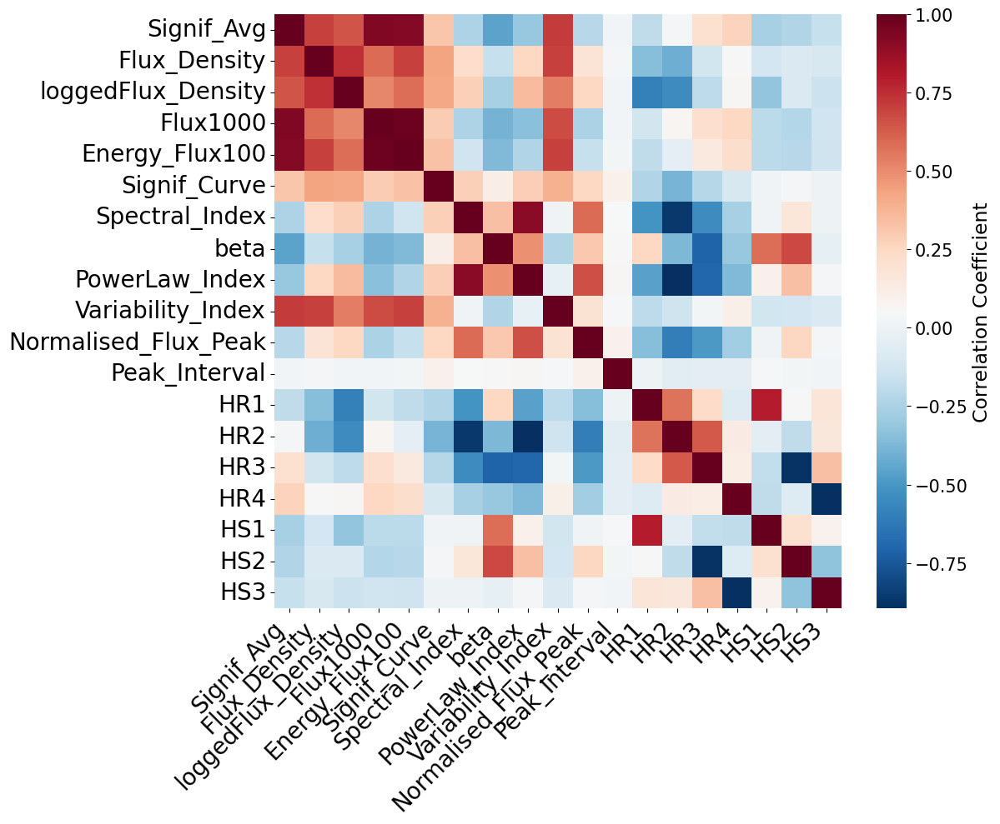

In [20]:
# Convert the filtered Table to a pandas DataFrame
df = blazarTable.to_pandas()

features = [
    "Signif_Avg",
    "Flux_Density",
    "loggedFlux_Density",
    "Flux1000",
    "Energy_Flux100",
    "Signif_Curve",
    "Spectral_Index",
    "beta",
    "PowerLaw_Index",
    "Variability_Index",
    "Normalised_Flux_Peak",
    "Peak_Interval",
    "HR1",
    "HR2",
    "HR3",
    "HR4",
    "HS1",
    "HS2",
    "HS3"
]

# Filter the DataFrame to include only the specified columns
df_features = df[features].copy()

# As Beta represents the curvature parameter for a LogParabola and -inf for all other spectral types, 
# but we only have LogParabola and PowerLaw for blls, fsrqs, and bcus in this data set
# set the -inf values to be -1000 to show that they are the powerLaw ones
df_features.loc[:, 'beta'] = df_features['beta'].replace(-np.inf, -1000)

# Remove all points which have NULL, NaN, or -inf values
# Replace -inf with NaN
df_features.replace([-np.inf, np.inf], np.nan, inplace=True)
# Drop rows with any NaN values
df_features.dropna(inplace=True)


corr_matrix = df_features.corr(method='pearson')

# Create a heatmap using Seaborn with adjusted figure size and label orientation
plt.figure(figsize=(12, 10))  # Increase the size as needed
heatmap = sns.heatmap(corr_matrix, annot=False, cmap='RdBu_r', fmt='.2f')

colorbar = heatmap.collections[0].colorbar
colorbar.ax.tick_params(labelsize=15)  # Set font size for the colorbar ticks
colorbar.set_label('Correlation Coefficient', size=17)  # Set label size

# Rotate the x and y axis labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right', fontsize=20)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=20)

# Display the heatmap
plt.tight_layout()
# plt.title('Correlation Matrix of Features', fontsize=16)
plt.show()


List all features that are highly correlated (correlation > 0.7)

In [21]:

for i in range(len(corr_matrix.columns)):
    for j in range(i):

        # Print variables with high correlation
        if abs(corr_matrix.iloc[i, j]) > 0.7:
            print(corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j])

loggedFlux_Density Flux_Density 0.7427262991619952
Flux1000 Signif_Avg 0.927464533713791
Energy_Flux100 Signif_Avg 0.9219984520726175
Energy_Flux100 Flux_Density 0.7004271274717412
Energy_Flux100 Flux1000 0.9809864723065985
PowerLaw_Index Spectral_Index 0.9074342739142854
Variability_Index Signif_Avg 0.7133283762228222
Variability_Index Flux_Density 0.7038178755677641
HR2 Spectral_Index -0.8602687370092614
HR2 PowerLaw_Index -0.8948761583924605
HR3 beta -0.7146109996870096
HS1 HR1 0.7939776753666947
HS2 HR3 -0.8810723810159937
HS3 HR4 -0.8945293911935708
